In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import random

In [2]:
pd.set_option('display.max_columns', None)
pd.reset_option('display.max_rows', None)

In [4]:
df = pd.read_csv("b2b_updated_final4.csv")
df_player = pd.read_csv("player_performance_data.csv")
df_team = pd.read_csv("team_data_updated.csv")

In [5]:
#Replacing Montréal Canadiens with Montreal Canadiens
df['homename'] = df['homename'].replace('Montréal Canadiens', 'Montreal Canadiens')
df['awayname'] = df['awayname'].replace('Montréal Canadiens', 'Montreal Canadiens')
df['winner'] = df['winner'].replace('Montréal Canadiens', 'Montreal Canadiens')

In [6]:
#Mapping conferences and divisions to the teams 
team_to_conference = {
    'Anaheim Ducks': 'Western',
    'Arizona Coyotes': 'Western',
    'Boston Bruins': 'Eastern',
    'Buffalo Sabres': 'Eastern',
    'Calgary Flames': 'Western',
    'Carolina Hurricanes': 'Eastern',
    'Chicago Blackhawks': 'Western',
    'Colorado Avalanche': 'Western',
    'Columbus Blue Jackets': 'Eastern',
    'Dallas Stars': 'Western',
    'Detroit Red Wings': 'Eastern',
    'Edmonton Oilers': 'Western',
    'Florida Panthers': 'Eastern',
    'Los Angeles Kings': 'Western',
    'Minnesota Wild': 'Western',
    'Montreal Canadiens': 'Eastern',
    'Nashville Predators': 'Western',
    'New Jersey Devils': 'Eastern',
    'New York Islanders': 'Eastern',
    'New York Rangers': 'Eastern',
    'Ottawa Senators': 'Eastern',
    'Philadelphia Flyers': 'Eastern',
    'Pittsburgh Penguins': 'Eastern',
    'San Jose Sharks': 'Western',
    'St. Louis Blues': 'Western',
    'Tampa Bay Lightning': 'Eastern',
    'Toronto Maple Leafs': 'Eastern',
    'Vancouver Canucks': 'Western',
    'Vegas Golden Knights': 'Western',
    'Washington Capitals': 'Eastern',
    'Winnipeg Jets': 'Western',
    'Seattle Kraken': 'Western',
    'Atlanta Thrashers': 'Eastern',  
    'Phoenix Coyotes': 'Western'  
}

team_to_division = {
    'Anaheim Ducks': 'Pacific',
    'Arizona Coyotes': 'Central',
    'Boston Bruins': 'Atlantic',
    'Buffalo Sabres': 'Atlantic',
    'Calgary Flames': 'Pacific',
    'Carolina Hurricanes': 'Metropolitan',
    'Chicago Blackhawks': 'Central',
    'Colorado Avalanche': 'Central',
    'Columbus Blue Jackets': 'Metropolitan',
    'Dallas Stars': 'Central',
    'Detroit Red Wings': 'Atlantic',
    'Edmonton Oilers': 'Pacific',
    'Florida Panthers': 'Atlantic',
    'Los Angeles Kings': 'Pacific',
    'Minnesota Wild': 'Central',
    'Montreal Canadiens': 'Atlantic',
    'Nashville Predators': 'Central',
    'New Jersey Devils': 'Metropolitan',
    'New York Islanders': 'Metropolitan',
    'New York Rangers': 'Metropolitan',
    'Ottawa Senators': 'Atlantic',
    'Philadelphia Flyers': 'Metropolitan',
    'Pittsburgh Penguins': 'Metropolitan',
    'San Jose Sharks': 'Pacific',
    'St. Louis Blues': 'Central',
    'Tampa Bay Lightning': 'Atlantic',
    'Toronto Maple Leafs': 'Atlantic',
    'Vancouver Canucks': 'Pacific',
    'Vegas Golden Knights': 'Pacific',
    'Washington Capitals': 'Metropolitan',
    'Winnipeg Jets': 'Central',
    'Seattle Kraken': 'Pacific',  
    'Atlanta Thrashers': 'Central',  
    'Phoenix Coyotes': 'Pacific'  
}


In [7]:
df = df[df['type'] == 'R']
df1 = df[df['season'] > 20092010]

In [8]:
df1 = df1.drop(['Unnamed: 0.1', 'Unnamed: 0', 'link'], axis = 1)

In [19]:
columns = ['season', 'teamname', 'conference', 'division', '%_congested_games']
conf_df = pd.DataFrame(columns=columns)

In [11]:
import warnings
warnings.simplefilter(action='ignore')


# Average number of congested period games for all teams per season

In [17]:
summary_df = pd.DataFrame(columns=['season', 'avg_B2B', 'avg_3in4', 'avg_5in8'])

for season, season_df in df.groupby('season'):
    total_B2B = 0
    total_3in4 = 0
    total_5in8 = 0
    total_teams = 0 

    for team_id, team_home_df in season_df.groupby(['homeid']):
        total_teams += 1 

        
        home_B2B = len(team_home_df[(team_home_df['home_b2b'] == 1)])
        home_3in4 = len(team_home_df[(team_home_df['home_3in4'] == 1)])
        home_5in8 = len(team_home_df[(team_home_df['home_5in8'] == 1)])

        
        team_away_df = season_df[season_df['awayid'] == team_id]
        away_B2B = len(team_away_df[(team_away_df['away_b2b'] == 1)])
        away_3in4 = len(team_away_df[(team_away_df['away_3in4'] == 1)])
        away_5in8 = len(team_away_df[(team_away_df['away_5in8'] == 1)])

        
        total_B2B += (home_B2B + away_B2B)
        total_3in4 += (home_3in4 + away_3in4)
        total_5in8 += (home_5in8 + away_5in8)


    avg_B2B = total_B2B / total_teams if total_teams else 0
    avg_3in4 = total_3in4 / total_teams if total_teams else 0
    avg_5in8 = total_5in8 / total_teams if total_teams else 0

    summary_df = summary_df.append({
        'season': season,
        'avg_B2B': avg_B2B,
        'avg_3in4': avg_3in4,
        'avg_5in8': avg_5in8
    }, ignore_index=True)

print(summary_df)


        season    avg_B2B   avg_3in4   avg_5in8
0   20002001.0  17.366667  16.266667  12.833333
1   20012002.0  14.166667  15.566667  15.200000
2   20022003.0  14.733333  16.600000  15.266667
3   20032004.0  15.633333  18.833333  16.766667
4   20052006.0  15.266667  16.666667  13.400000
5   20062007.0  14.700000  14.566667  11.700000
6   20072008.0  15.233333  16.333333  12.733333
7   20082009.0  15.100000  15.766667  12.500000
8   20092010.0  15.066667  17.900000  17.433333
9   20102011.0  15.866667  16.233333  13.233333
10  20112012.0  13.866667  15.066667  14.166667
11  20122013.0   8.766667  12.000000  13.533333
12  20132014.0  14.700000  16.666667  15.900000
13  20142015.0  13.800000  15.733333  14.433333
14  20152016.0  13.833333  15.266667  12.733333
15  20162017.0  14.833333  17.700000  17.900000
16  20172018.0  13.935484  14.967742  13.064516
17  20182019.0  12.967742  15.580645  15.193548
18  20192020.0  11.354839  12.290323  10.580645
19  20202021.0   9.677419  15.419355  20

# Evolution of congested games per division 

In [20]:
for season, season_df in df.groupby('season'):
    for team_id, team_home_df in season_df.groupby(['homeid']):
        team_name = team_home_df['homename'].iloc[0]

        home_congested_games = len(team_home_df[(team_home_df['home_5in8'] == 1)])

        team_away_df = season_df[season_df['awayid'] == team_id]
        away_congested_games = len(team_away_df[(team_away_df['away_5in8'] == 1)])
        
        total_games = len(team_home_df) + len(team_away_df)
        total_congested_games = home_congested_games + away_congested_games
        
        percent_congested = (total_congested_games / total_games) * 100 if total_games != 0 else 0
        
        new_row = {
            'season': season,
            'teamname': team_name,
            'conference': team_to_conference.get(team_name, 'Unknown'),
            'division': team_to_division.get(team_name, 'Unknown'),
            '%_congested_games': percent_congested
        }
        
        conf_df = conf_df.append(new_row, ignore_index=True)


In [22]:
conf_df.head(5)

,season,teamname,conference,division,%_congested_games
0,20002001,New Jersey Devils,Eastern,Metropolitan,13.414634
1,20002001,New York Islanders,Eastern,Metropolitan,17.073171
2,20002001,New York Rangers,Eastern,Metropolitan,25.609756
3,20002001,Philadelphia Flyers,Eastern,Metropolitan,4.878049
4,20002001,Pittsburgh Penguins,Eastern,Metropolitan,10.975610


In [23]:
division_avg_df = pd.DataFrame(columns=['season', 'division', 'avg_%_congested_games'])

for season, season_df in conf_df.groupby('season'):
    for division, division_df in season_df.groupby('division'):
        avg_congested = division_df['%_congested_games'].mean()
        
        division_avg_df = division_avg_df.append({'season': season, 'division': division, 'avg_%_congested_games': avg_congested}, ignore_index=True)


In [24]:
team_avg_df = pd.DataFrame(columns=['season', 'teamname', 'avg_%_congested_games'])

for season, season_df in conf_df.groupby('season'):
    
    for team, team_df in season_df.groupby('teamname'):
        
        avg_congested = team_df['%_congested_games'].mean()
        
        team_avg_df = team_avg_df.append({'season': season, 'teamname': team, 'avg_%_congested_games': avg_congested}, ignore_index=True)


In [26]:
team_avg_df.head(5)

,season,teamname,avg_%_congested_games
0,20002001,Anaheim Ducks,17.073171
1,20002001,Atlanta Thrashers,18.292683
2,20002001,Boston Bruins,17.073171
3,20002001,Buffalo Sabres,18.292683
4,20002001,Calgary Flames,14.634146


In [27]:
def format_season(season):
    season_str = str(season)
    return f"{season_str[:4]}-{season_str[4:]}"



In [28]:
division_avg_df['season'] = division_avg_df['season'].apply(format_season)

In [14]:
import os
output_directory = "/Users/hrishikeshdabir/Teams/"  
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

[None, None]

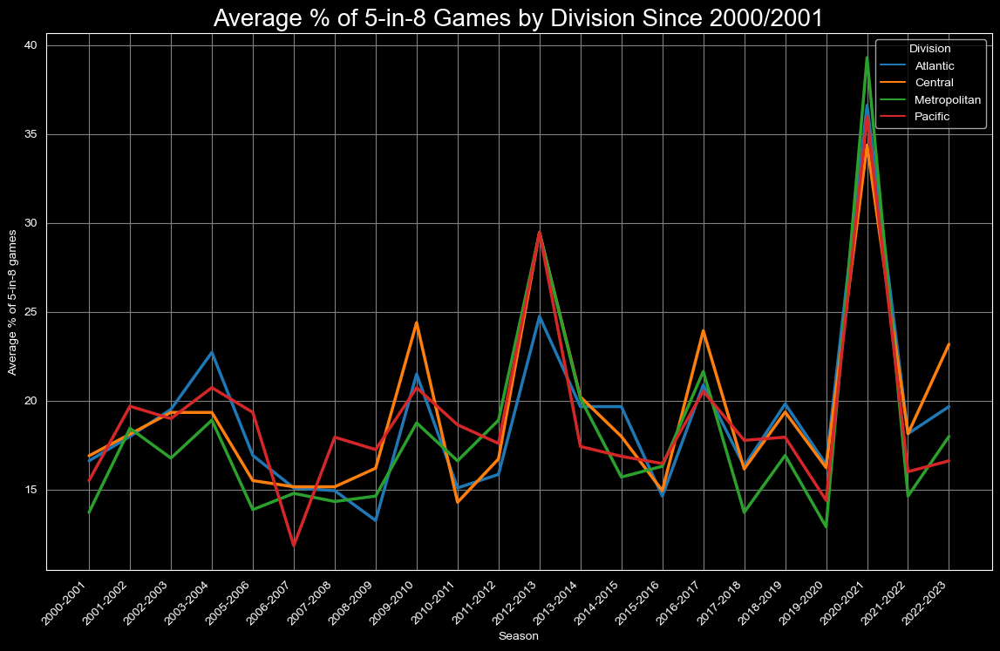

In [29]:
import matplotlib.font_manager

fig = plt.figure(figsize=(14, 8))
fig.patch.set_facecolor('black')

sns.set_style("darkgrid", {"axes.facecolor": "#000000"})

sns.lineplot(data=division_avg_df, x='season', y='avg_%_congested_games', hue='division', linewidth=2.5)

# Customize plot appearance
plt.xlabel('Season', color='#FFFFFF')
plt.ylabel('Average % of 5-in-8 games', color='#FFFFFF')
plt.title('Average % of 5-in-8 Games by Division Since 2000/2001', color='#ffffff', fontname="Arial", fontsize=20)
plt.grid(True, color='grey')

plt.xticks(
        rotation = 45, 
        horizontalalignment = 'right',
        fontweight = 'light',
        fontsize = 'medium'
    )
ax = plt.gca()  
ax.tick_params(axis='x', colors='#FFFFFF')
ax.tick_params(axis='y', colors='#FFFFFF')
ax.xaxis.label.set_color('#FFFFFF')
ax.yaxis.label.set_color('#FFFFFF')


legend = plt.legend(title='Division')
plt.setp(legend.get_texts(), color='#FFFFFF')
plt.setp(legend.get_title(), color='#FFFFFF')



# Evolution of Congested games per conference 

In [35]:
conf_avg_df = pd.DataFrame(columns=['season', 'conference', 'avg_%_congested_games'])


for season, season_df in conf_df.groupby('season'):
    
    for conf, conf_df in season_df.groupby('conference'):
        
        avg_congested = conf_df['%_congested_games'].mean()
        
        conf_avg_df = conf_avg_df.append({'season': season, 'conference': conf, 'avg_%_congested_games': avg_congested}, ignore_index=True)


In [36]:
conf_avg_df['season'] = conf_avg_df['season'].apply(format_season)

[None, None]

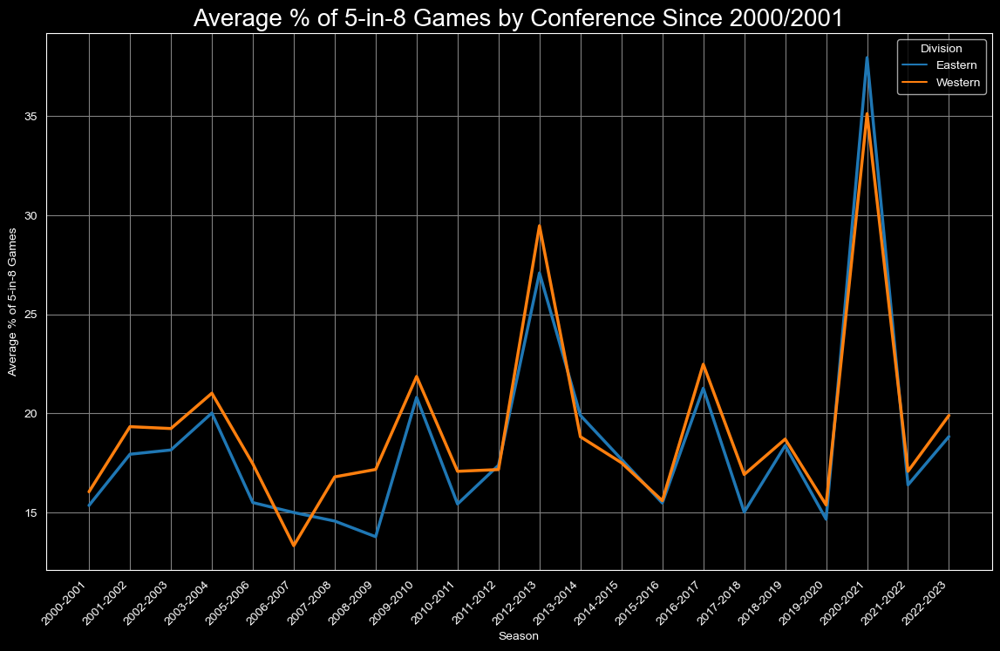

In [34]:
fig = plt.figure(figsize=(14, 8))
fig.patch.set_facecolor('black')

sns.set_style("darkgrid", {"axes.facecolor": "#000000"})

sns.lineplot(data=conf_avg_df, x='season', y='avg_%_congested_games', hue='conference', linewidth=2.5)

plt.xlabel('Season', color='#FFFFFF')
plt.ylabel('Average % of 5-in-8 Games', color='#FFFFFF')
plt.title('Average % of 5-in-8 Games by Conference Since 2000/2001', color='#ffffff', fontname="Arial", fontsize=20)
plt.grid(True, color='grey')

plt.xticks(
        rotation = 45, 
        horizontalalignment = 'right',
        fontweight = 'light',
        fontsize = 'medium'
    )
ax = plt.gca()  # get current axis
ax.tick_params(axis='x', colors='#FFFFFF')
ax.tick_params(axis='y', colors='#FFFFFF')
ax.xaxis.label.set_color('#FFFFFF')
ax.yaxis.label.set_color('#FFFFFF')

legend = plt.legend(title='Division')
plt.setp(legend.get_texts(), color='#FFFFFF')
plt.setp(legend.get_title(), color='#FFFFFF')

# Congested Games per team

[None, None]

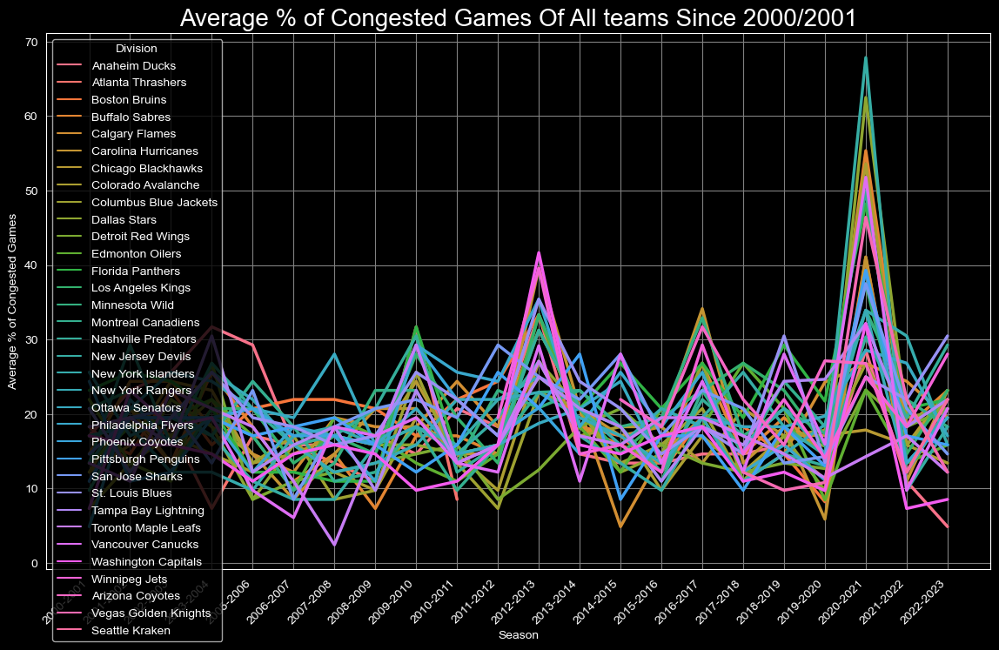

In [54]:
team_avg_df['season'] = team_avg_df['season'].apply(format_season)
fig = plt.figure(figsize=(14, 8))
fig.patch.set_facecolor('black')

sns.set_style("darkgrid", {"axes.facecolor": "#000000"})

sns.lineplot(data=team_avg_df, x='season', y='avg_%_congested_games', hue='teamname', linewidth=2.5)

plt.xlabel('Season', color='#FFFFFF')
plt.ylabel('Average % of Congested Games', color='#FFFFFF')
plt.title('Average % of Congested Games Of All teams Since 2000/2001', color='#ffffff', fontname="Arial", fontsize=20)
plt.grid(True, color='grey')

plt.xticks(
        rotation = 45, 
        horizontalalignment = 'right',
        fontweight = 'light',
        fontsize = 'medium'
    )
ax = plt.gca()  
ax.tick_params(axis='x', colors='#FFFFFF')
ax.tick_params(axis='y', colors='#FFFFFF')
ax.xaxis.label.set_color('#FFFFFF')
ax.yaxis.label.set_color('#FFFFFF')

legend = plt.legend(title='Division')
plt.setp(legend.get_texts(), color='#FFFFFF')
plt.setp(legend.get_title(), color='#FFFFFF')

# Congested Games win % per division

In [38]:
team_win_df = pd.DataFrame(columns=['season', 'teamname', 'division', 'avg_win%_congested_games'])

for season, season_df in df.groupby('season'):
    for team_id, team_df in season_df.groupby(['homeid']):
        
        team_name = team_df['homename'].iloc[0]
        
        congested_games = team_df[(team_df['home_b2b'] == 1) | (team_df['home_3in4'] == 1) | (team_df['home_5in8'] == 1)]
        congested_games_away = season_df[(season_df['awayid'] == team_id) & ((season_df['away_b2b'] == 1) | (season_df['away_3in4'] == 1) | (season_df['away_5in8'] == 1))]
        
        total_congested_games = len(congested_games) + len(congested_games_away)
        
        home_wins_in_congested_games = len(congested_games[congested_games['winner'] == team_name])
        away_wins_in_congested_games = len(congested_games_away[congested_games_away['winner'] == team_name])
        
        total_wins_in_congested_games = home_wins_in_congested_games + away_wins_in_congested_games
        
        avg_win_percent = (total_wins_in_congested_games / total_congested_games) * 100 if total_congested_games != 0 else 0
        
        new_row = {
            'season': season,
            'teamname': team_name,
            'division': team_to_division.get(team_name, 'Unknown'),
            'avg_win%_congested_games': avg_win_percent
        }
        
        team_win_df = team_win_df.append(new_row, ignore_index=True)


In [39]:
team_win_df.head(5)

,season,teamname,division,avg_win%_congested_games
0,20002001,New Jersey Devils,Metropolitan,58.333333
1,20002001,New York Islanders,Metropolitan,26.470588
2,20002001,New York Rangers,Metropolitan,47.058824
3,20002001,Philadelphia Flyers,Metropolitan,53.846154
4,20002001,Pittsburgh Penguins,Metropolitan,53.125000


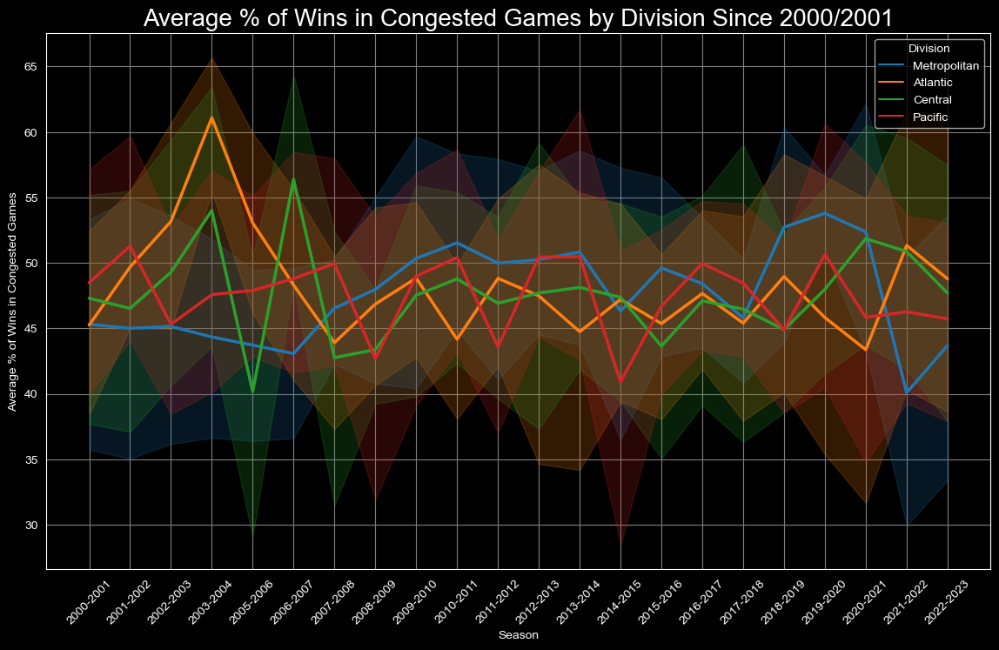

In [40]:
team_win_df['season'] = team_win_df['season'].apply(format_season)

fig, ax = plt.subplots(figsize=(14, 8))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')


sns.set_style("darkgrid", {"axes.facecolor": "#000000"})

sns.lineplot(data=team_win_df, x='season', y='avg_win%_congested_games', hue='division', linewidth=2.5)

plt.xlabel('Season', color='white')
plt.ylabel('Average % of Wins in Congested Games', color='white')
plt.title('Average % of Wins in Congested Games by Division Since 2000/2001', color='white', fontname="Arial", fontsize=20)
plt.grid(True, color='grey')


plt.xticks(rotation=45, fontsize='medium', color='white')
plt.yticks(color='white')

legend = plt.legend(title='Division')
plt.setp(legend.get_texts(), color='white')
plt.setp(legend.get_title(), color='white')

plt.show()

# Congesed wins for teams in each division

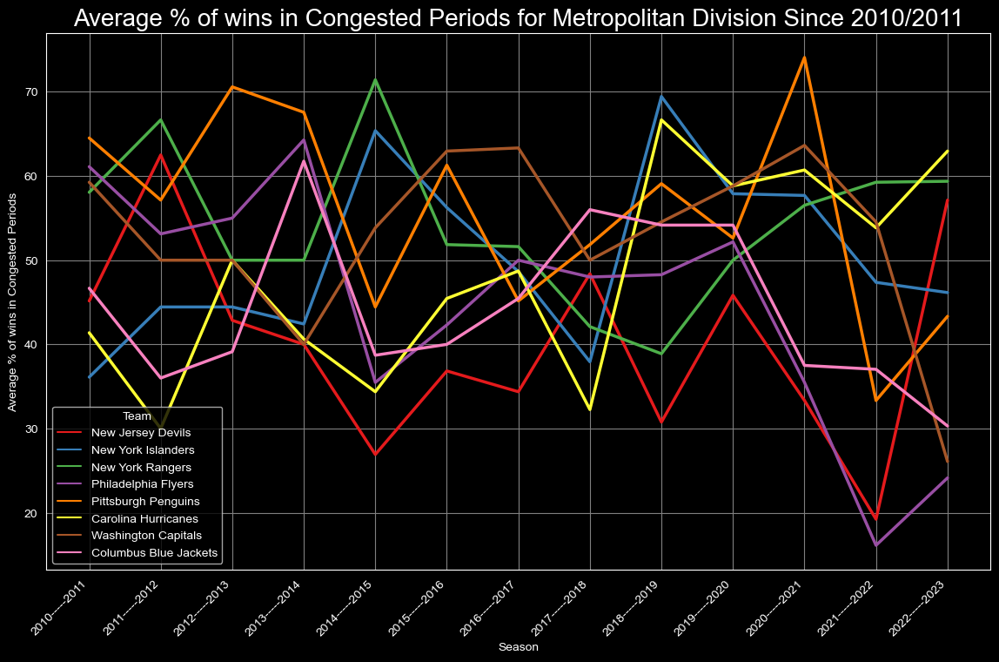

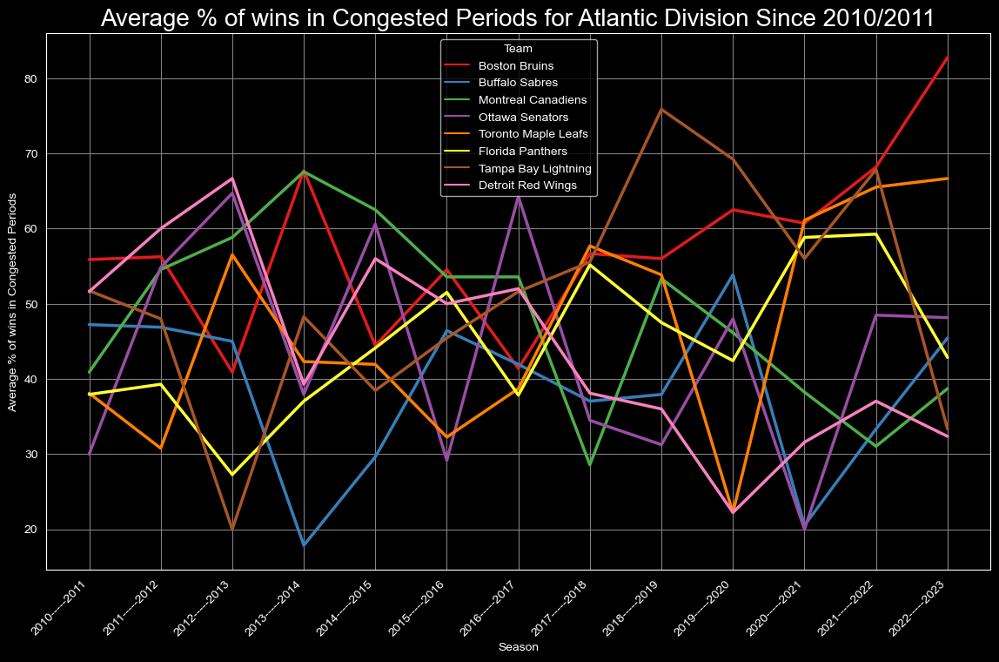

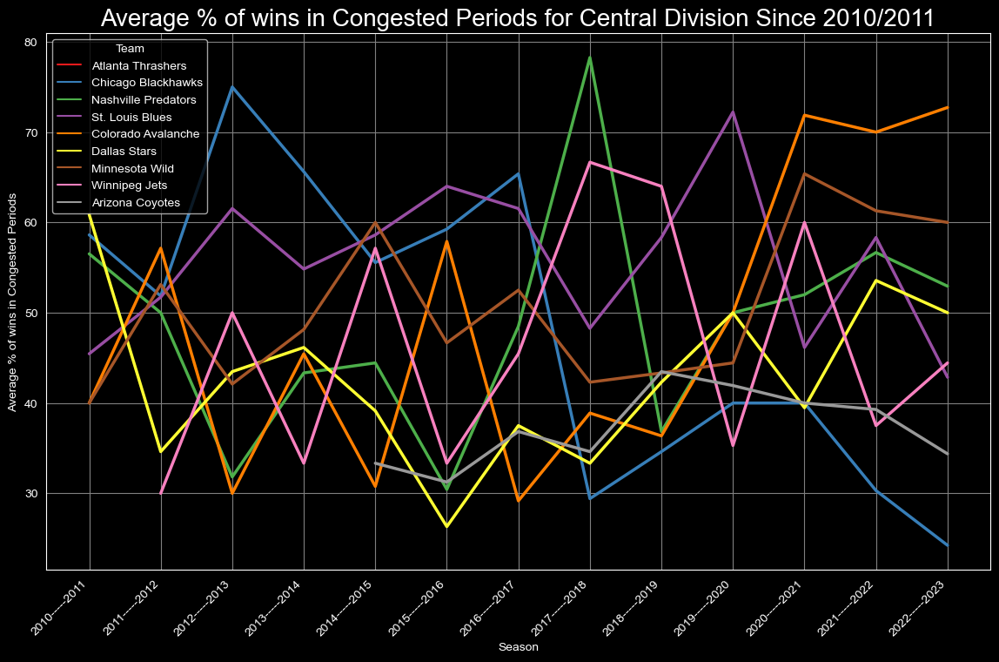

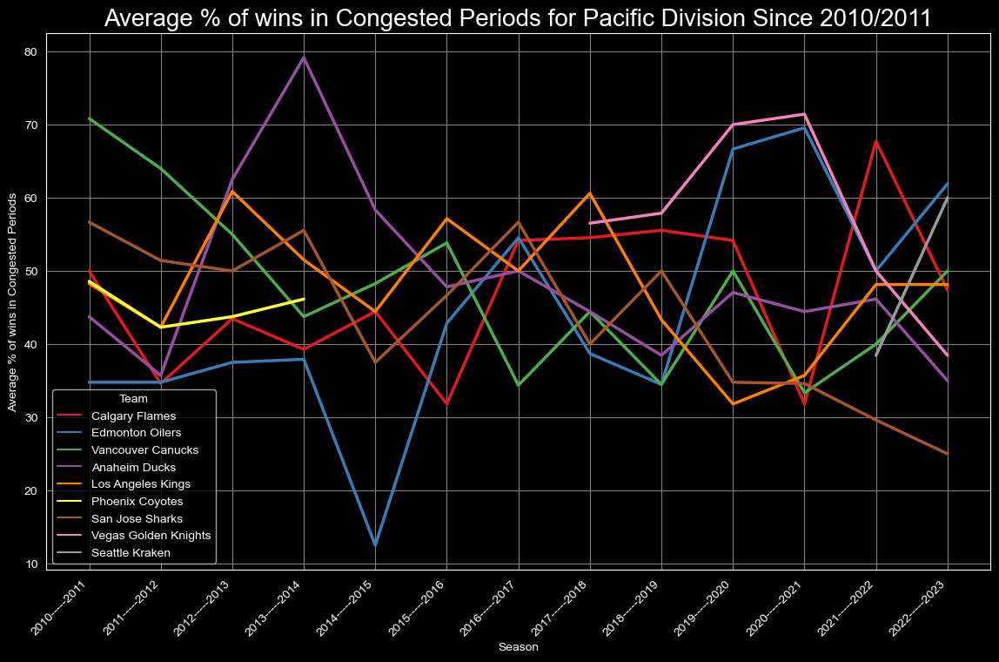

In [44]:
team_win_df['season'] = team_win_df['season'].apply(format_season)
team_win_df = team_win_df[team_win_df['season'] > '20092010']

division_names = ['Central', 'Metropolitan', 'Pacific', 'Atlantic']

for division in team_win_df['division'].unique():
    division_df = team_win_df[team_win_df['division'] == division]
    
    fig = plt.figure(figsize=(14, 8))
    fig.patch.set_facecolor('black')
    
    sns.set_style("darkgrid", {"axes.facecolor": "#000000"})
    
    sns.lineplot(data=division_df, x='season', y='avg_win%_congested_games', hue='teamname', linewidth=2.5, palette = 'Set1')
    
    plt.xlabel('Season', color='#FFFFFF')
    plt.ylabel('Average % of wins in Congested Periods', color='#FFFFFF')
    plt.title(f'Average % of wins in Congested Periods for {division} Division Since 2010/2011', color='#ffffff', fontname="Arial", fontsize=20)
    plt.grid(False, color='grey')
    
    plt.xticks(
            rotation = 45, 
            horizontalalignment = 'right',
            fontweight = 'light',
            fontsize = 'medium'
        )
        
    ax = plt.gca()
    ax.tick_params(axis='x', colors='#FFFFFF')
    ax.tick_params(axis='y', colors='#FFFFFF')
    ax.xaxis.label.set_color('#FFFFFF')
    ax.yaxis.label.set_color('#FFFFFF')
    
    legend = plt.legend(title='Team')
    plt.setp(legend.get_texts(), color='#FFFFFF')
    plt.setp(legend.get_title(), color='#FFFFFF')
    
    fig.savefig(os.path.join(output_directory, f'graph_{division}.png'), bbox_inches='tight')
       

# Calculating the Win% for all the teams

In [45]:
new_df = pd.DataFrame(columns=['season', 'teamname', 'conference', 'division', '%_b2b_games', '%_3in4_games', '%_5in8_games'])

for season, season_df in df.groupby('season'):
    for team_id, team_home_df in season_df.groupby(['homeid']):
        team_name = team_home_df['homename'].iloc[0]


        home_b2b_games = len(team_home_df[team_home_df['home_b2b'] == 1])
        home_3in4_games = len(team_home_df[team_home_df['home_3in4'] == 1])
        home_5in8_games = len(team_home_df[team_home_df['home_5in8'] == 1])

        team_away_df = season_df[season_df['awayid'] == team_id]
        away_b2b_games = len(team_away_df[team_away_df['away_b2b'] == 1])
        away_3in4_games = len(team_away_df[team_away_df['away_3in4'] == 1])
        away_5in8_games = len(team_away_df[team_away_df['away_5in8'] == 1])
        
        total_games = len(team_home_df) + len(team_away_df)

        percent_b2b = ((home_b2b_games + away_b2b_games) / total_games) * 100 if total_games != 0 else 0
        percent_3in4 = ((home_3in4_games + away_3in4_games) / total_games) * 100 if total_games != 0 else 0
        percent_5in8 = ((home_5in8_games + away_5in8_games) / total_games) * 100 if total_games != 0 else 0


        new_row = {
            'season': season,
            'teamname': team_name,
            'conference': team_to_conference.get(team_name, 'Unknown'),
            'division': team_to_division.get(team_name, 'Unknown'),
            '%_b2b_games': percent_b2b,
            '%_3in4_games': percent_3in4,
            '%_5in8_games': percent_5in8
        }
        
        new_df = new_df.append(new_row, ignore_index=True)


In [46]:
games = []
for index, row in df1.iterrows():
    for side in ['home', 'away']:
        is_b2b = row[side + '_b2b']
        is_winner = row['winner'] == row[side + 'name']
        team_name = row[side + 'name']
        season = row['season']
        games.append([team_name, season, is_b2b, is_winner])

In [47]:
columns = ['team_name', 'season', 'is_b2b', 'is_winner']
games_df = pd.DataFrame(games, columns=columns)

In [48]:
win_percentage = (
    games_df
    .groupby(['team_name', 'season', 'is_b2b'])
    .is_winner.mean()
    .reset_index()
)

win_percentage_pivot = (
    win_percentage
    .pivot_table(index=['team_name', 'season'], columns='is_b2b', values='is_winner', fill_value=0)
    .reset_index()
)
win_percentage_pivot.columns = ['team_name', 'season', 'non_b2b_win_percentage', 'b2b_win_percentage']

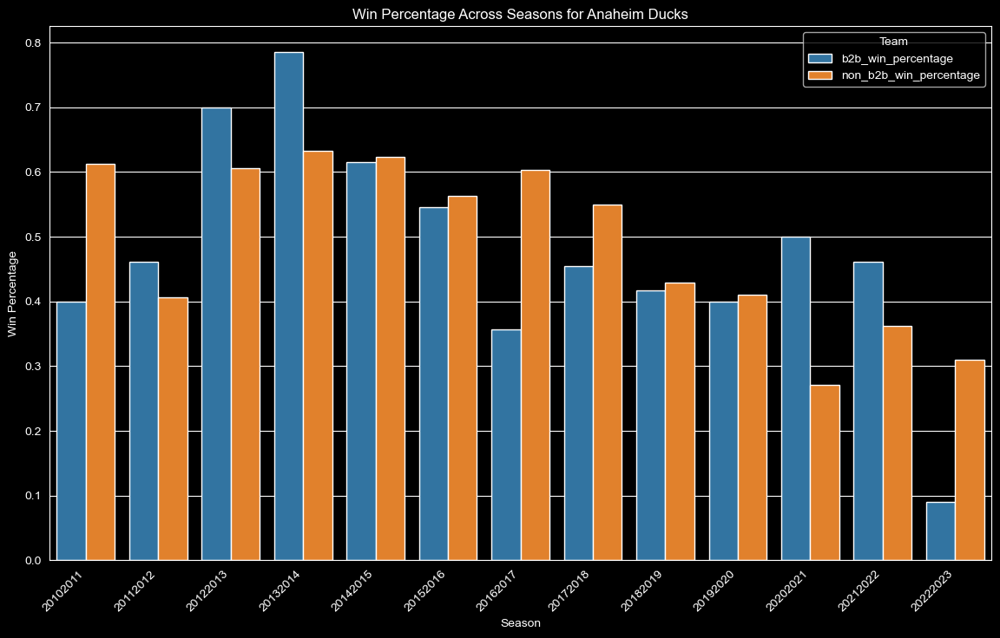

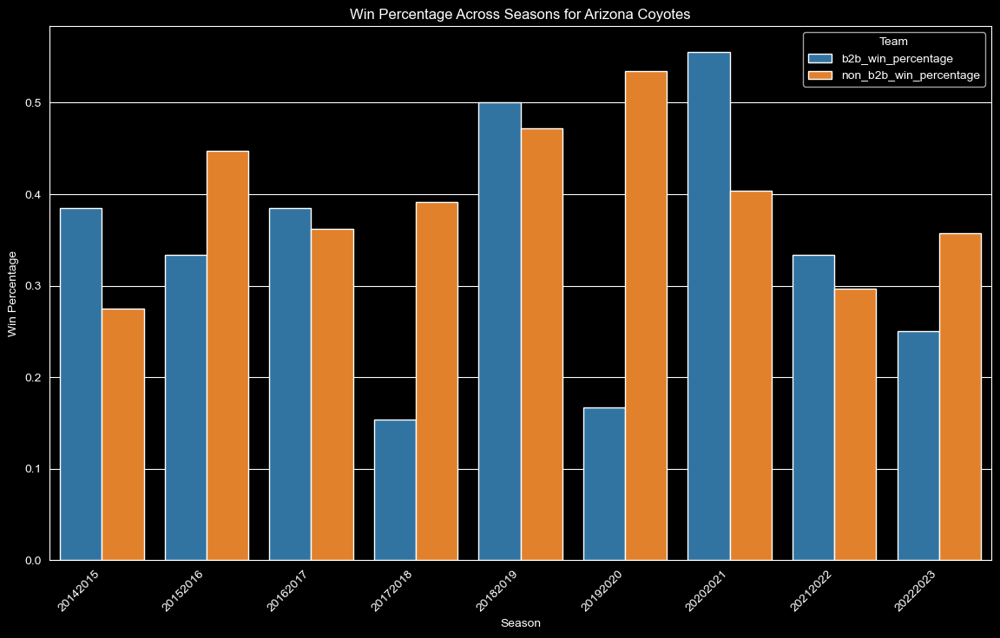

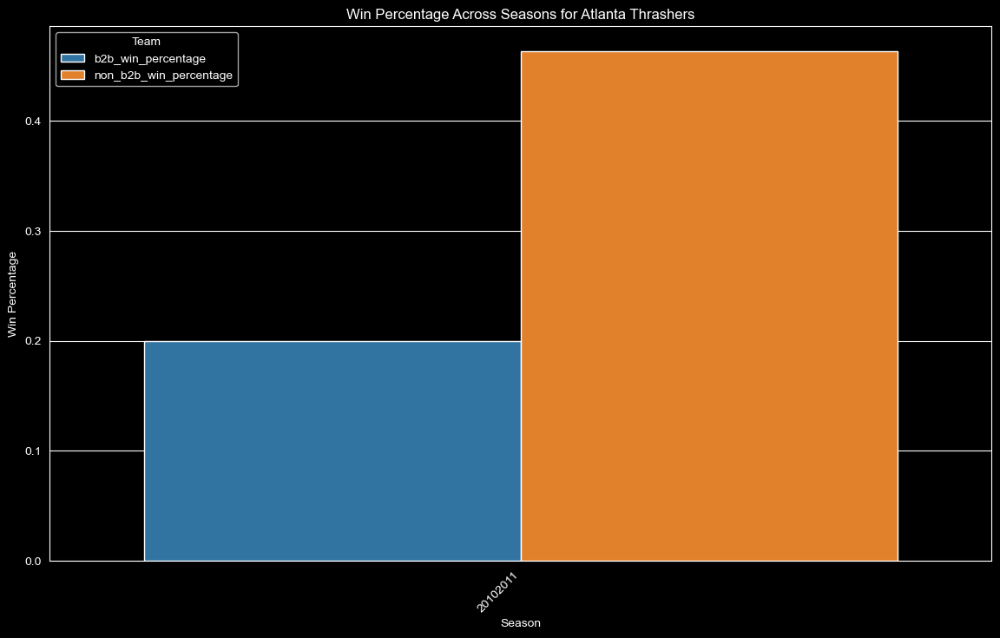

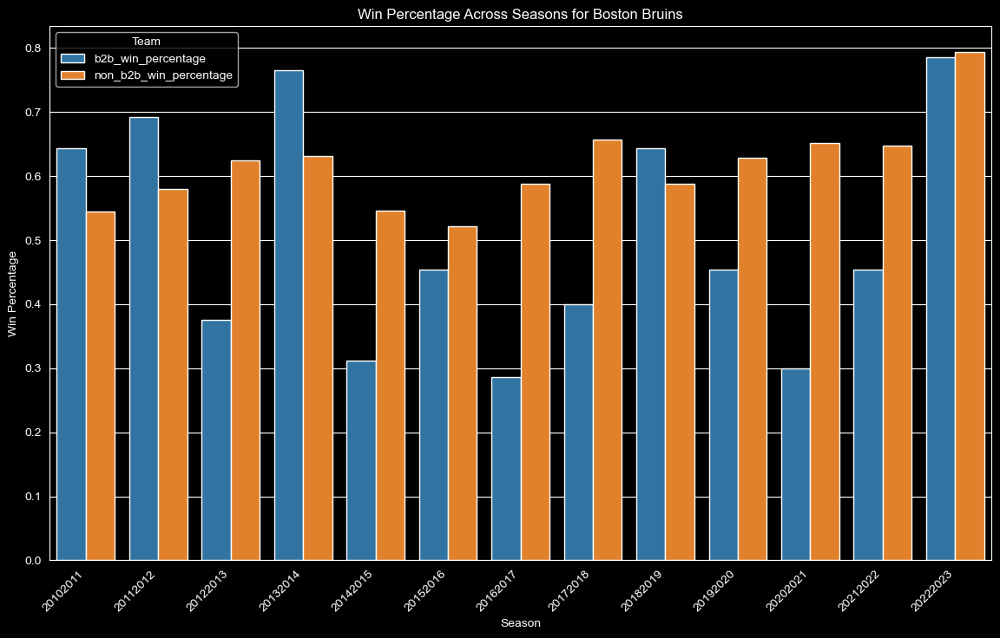

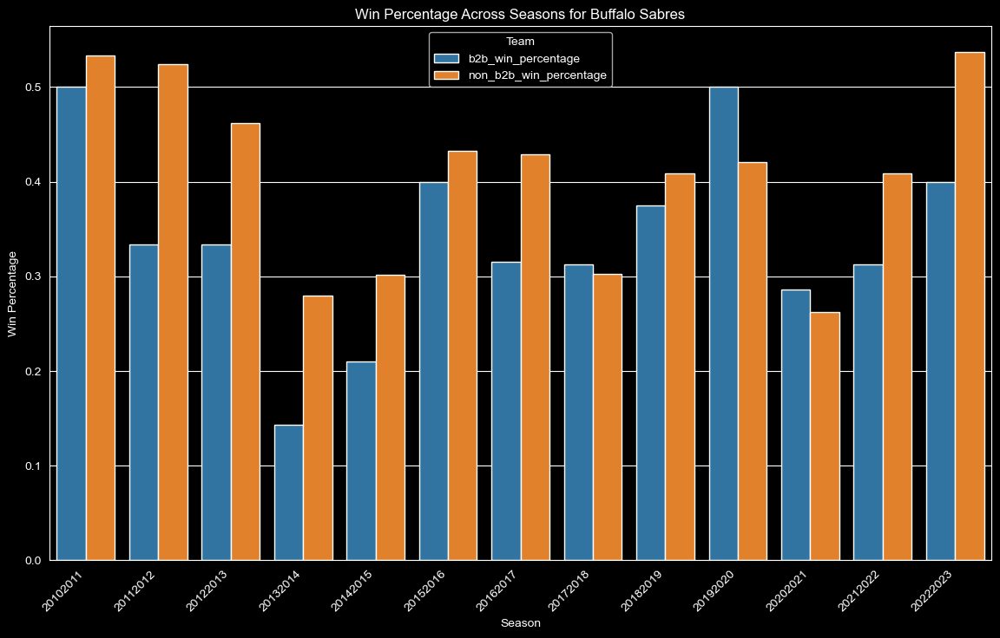

...

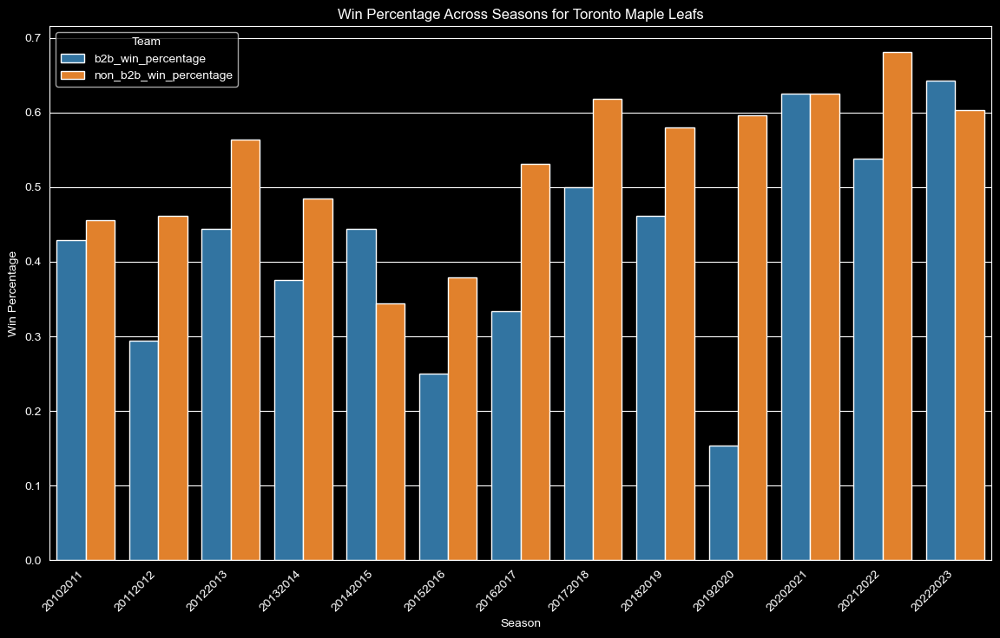

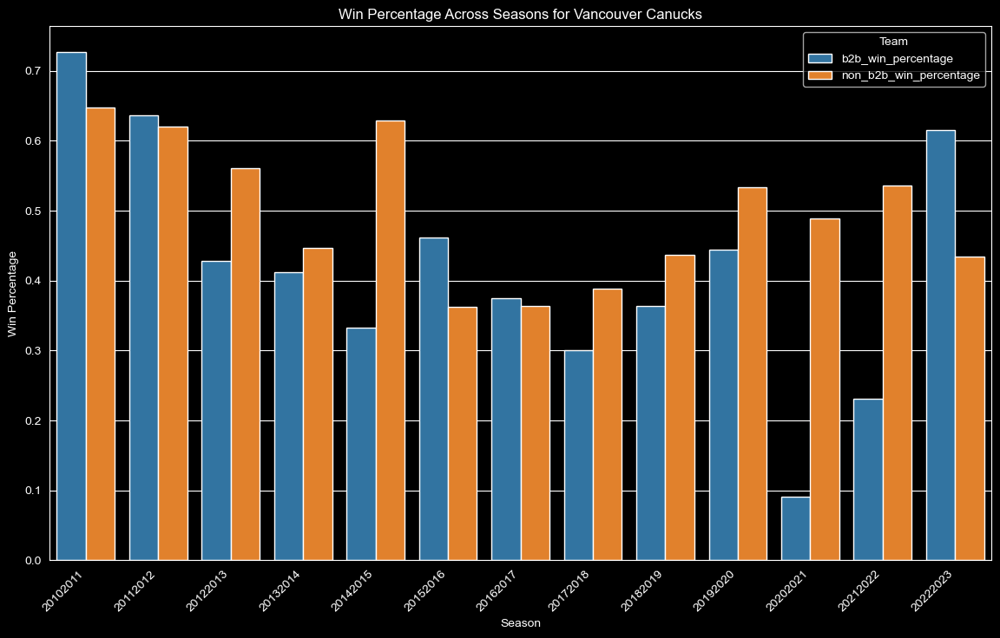

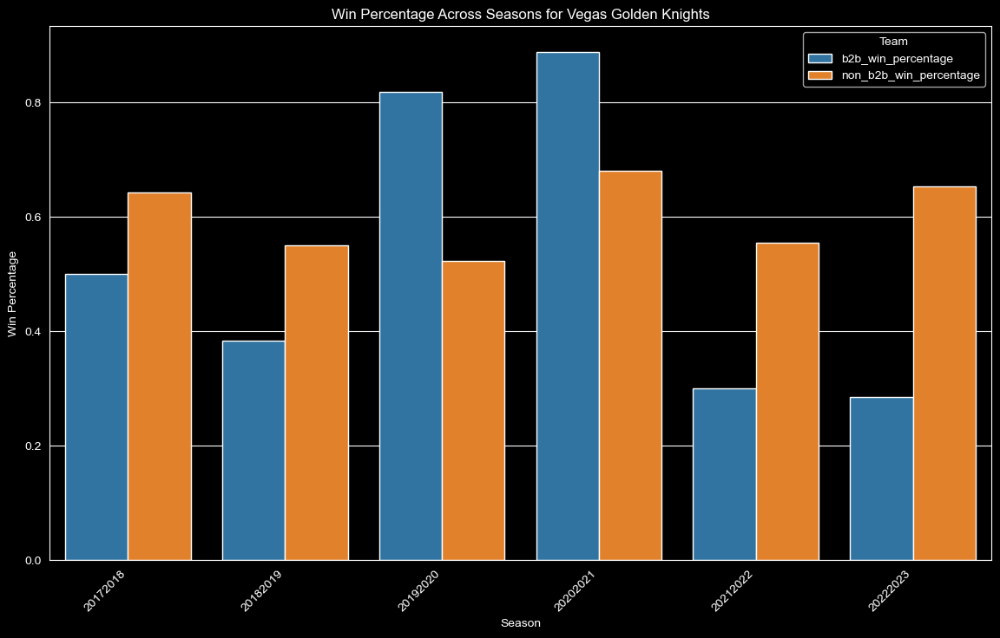

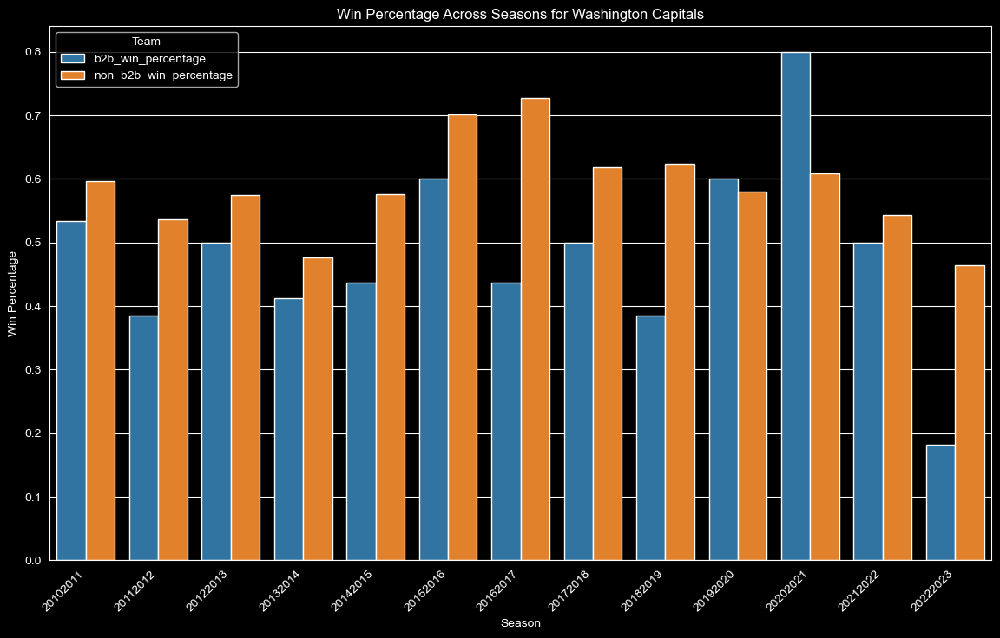

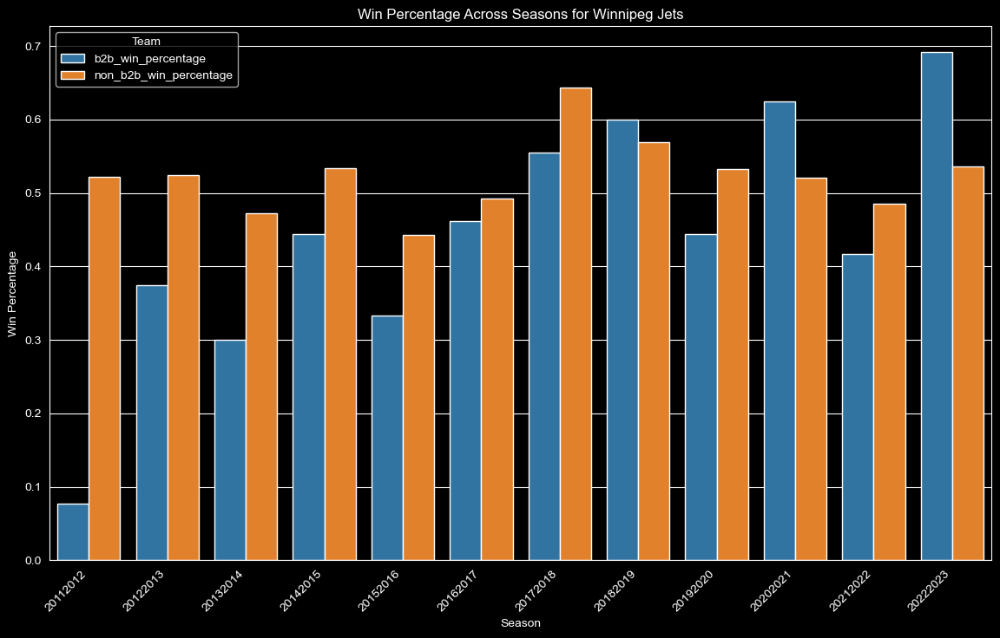

In [52]:
melted_df = win_percentage_pivot.melt(id_vars=['team_name', 'season'], 
                                      value_vars=['b2b_win_percentage', 'non_b2b_win_percentage'],
                                      var_name='game_type', value_name='win_percentage')

for team in melted_df['team_name'].unique():
    team_data = melted_df[melted_df['team_name'] == team]
    fig = plt.figure(figsize=(14, 8))
    fig.patch.set_facecolor('black')
    sns.barplot(x = 'season', y = 'win_percentage', 
                hue = 'game_type', 
                data = team_data)
    plt.xticks(
        rotation = 45, 
        horizontalalignment = 'right',
        fontweight = 'light',
        fontsize = 'medium'
    )
    plt.title(f'Win Percentage Across Seasons for {team}', color='#FFFFFF')
    plt.ylabel('Win Percentage', color='#FFFFFF')
    plt.xlabel('Season', color='#FFFFFF')
    
    ax = plt.gca()
    ax.tick_params(axis='x', colors='#FFFFFF')
    ax.tick_params(axis='y', colors='#FFFFFF')
    ax.xaxis.label.set_color('#FFFFFF')
    ax.yaxis.label.set_color('#FFFFFF')
    
    legend = plt.legend(title='Team')
    plt.setp(legend.get_texts(), color='#FFFFFF')
    plt.setp(legend.get_title(), color='#FFFFFF')
    
    safe_filename = team.replace(" ", "_").replace("/", "_")
    fig.savefig(os.path.join(output_directory, f'win_percentage_{safe_filename}.png'), bbox_inches='tight')

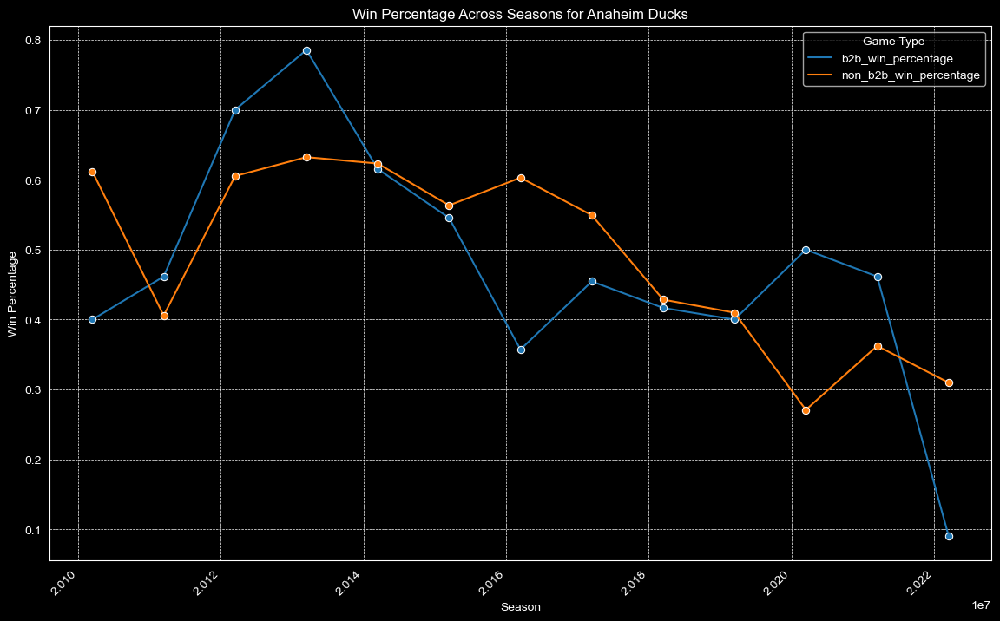

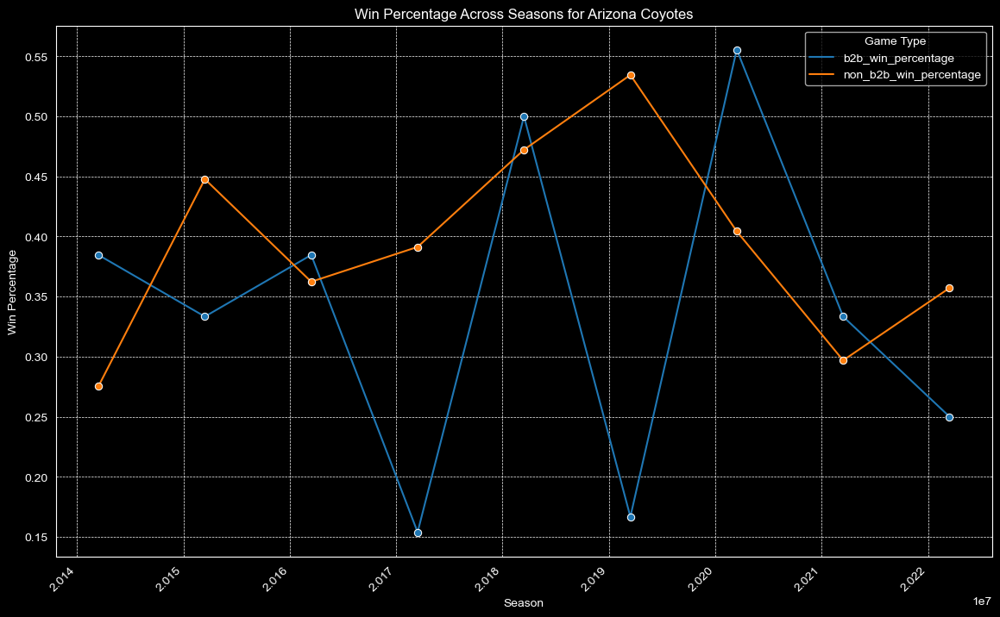

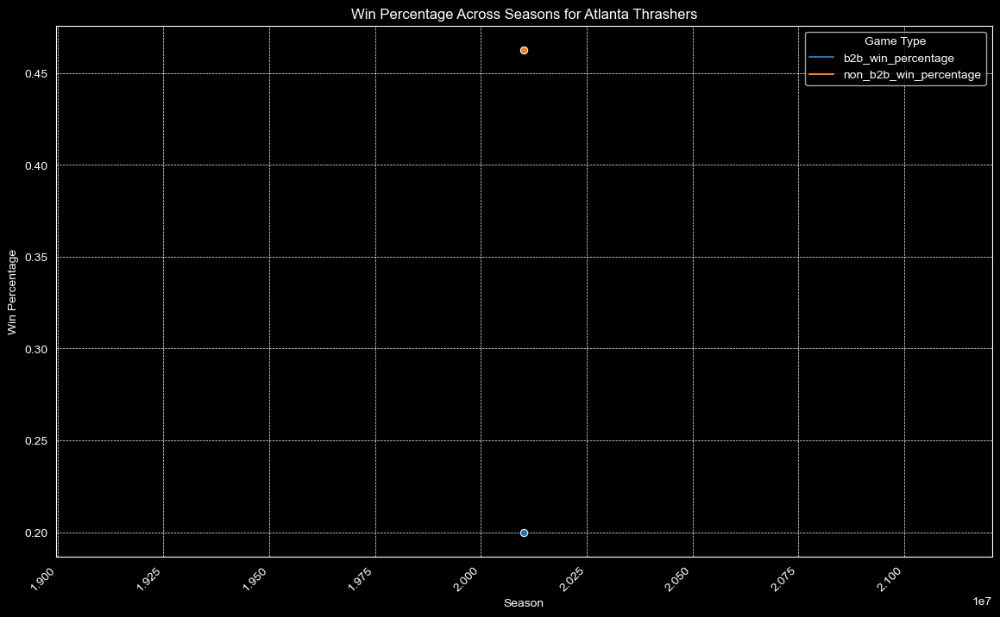

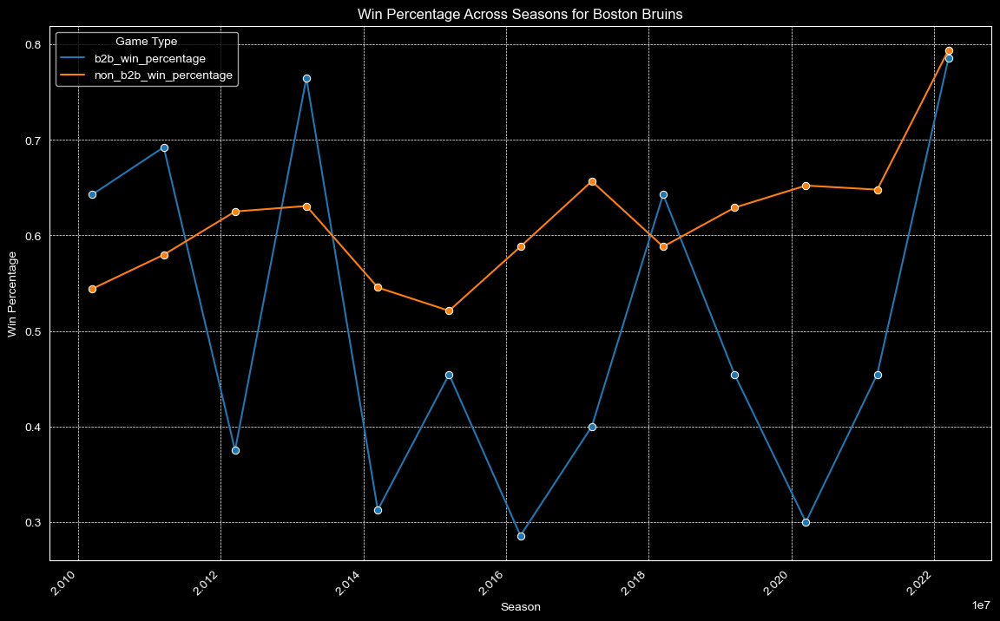

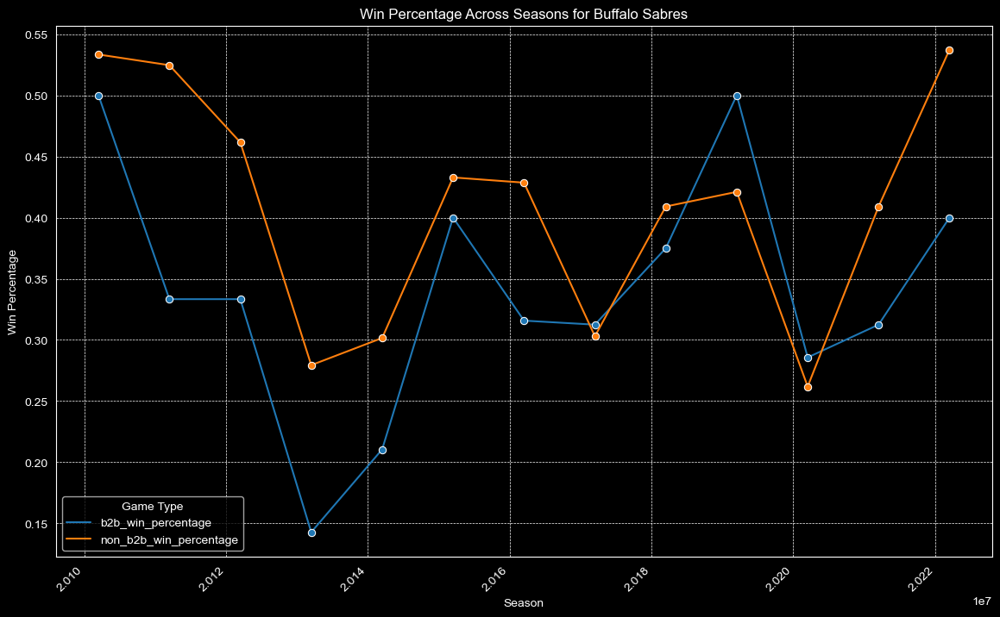

...

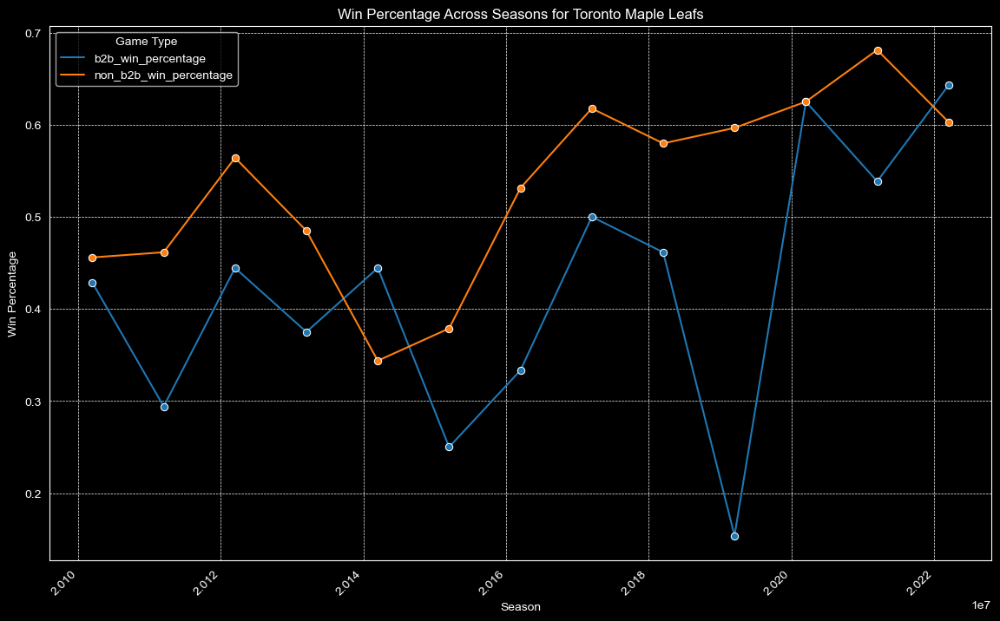

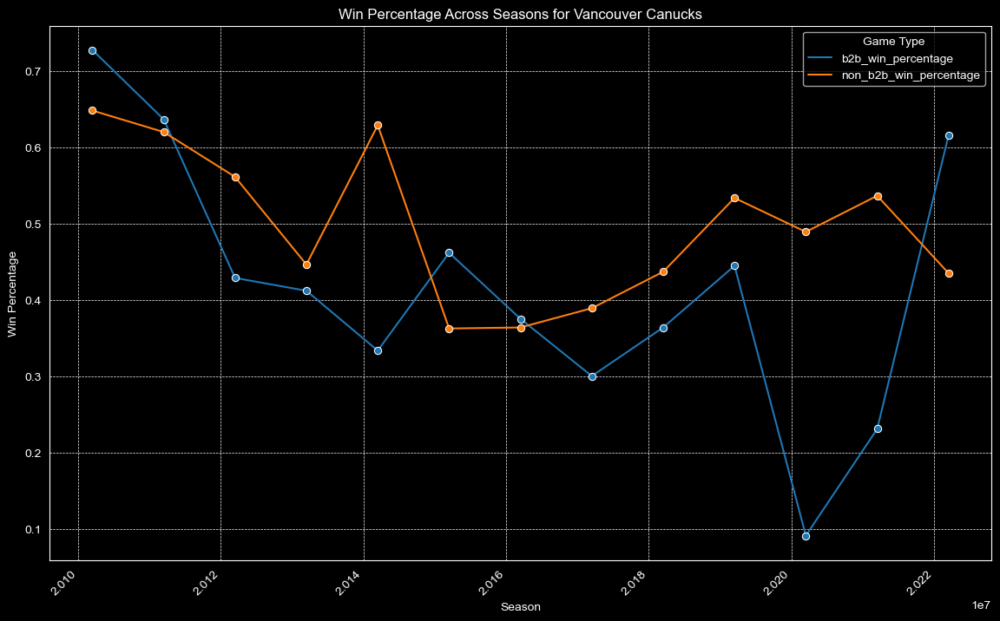

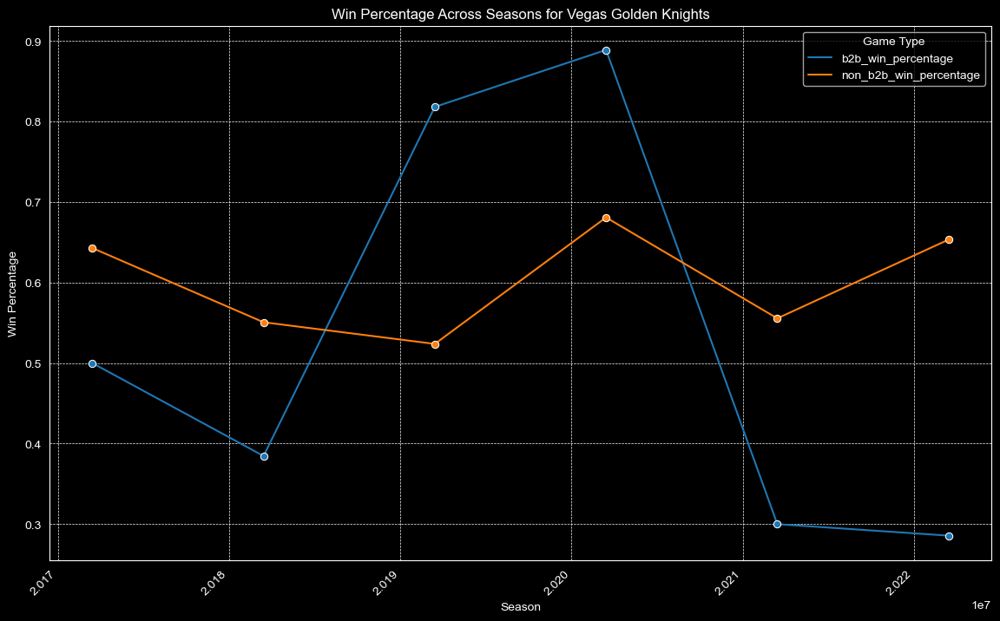

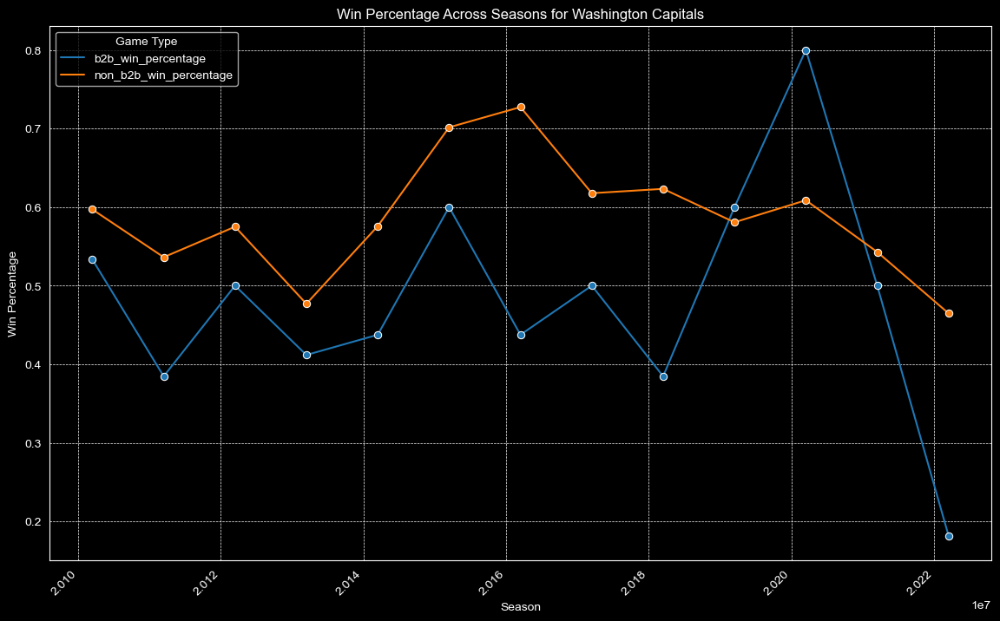

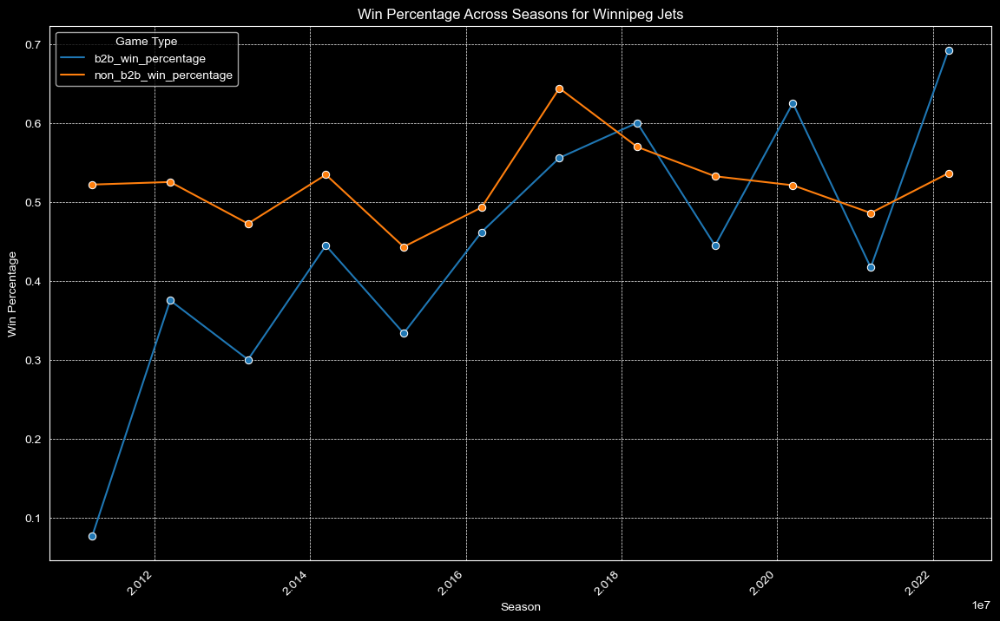

In [53]:
melted_df = win_percentage_pivot.melt(id_vars=['team_name', 'season'], 
                                      value_vars=['b2b_win_percentage', 'non_b2b_win_percentage'],
                                      var_name='game_type', value_name='win_percentage')

for team in melted_df['team_name'].unique():
    team_data = melted_df[melted_df['team_name'] == team]
    fig = plt.figure(figsize=(14, 8))
    fig.patch.set_facecolor('black')
    
    sns.lineplot(x='season', y='win_percentage', hue='game_type', data=team_data, marker='o')
    
    plt.xticks(
        rotation=45, 
        horizontalalignment='right',
        fontweight='light',
        fontsize='medium'
    )
    plt.title(f'Win Percentage Across Seasons for {team}', color='#FFFFFF')
    plt.ylabel('Win Percentage', color='#FFFFFF')
    plt.xlabel('Season', color='#FFFFFF')
    
    ax = plt.gca()
    ax.tick_params(axis='x', colors='#FFFFFF')
    ax.tick_params(axis='y', colors='#FFFFFF')
    ax.xaxis.label.set_color('#FFFFFF')
    ax.yaxis.label.set_color('#FFFFFF')
    
    legend = plt.legend(title='Game Type')
    plt.setp(legend.get_texts(), color='#FFFFFF')
    plt.setp(legend.get_title(), color='#FFFFFF')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    safe_filename = team.replace(" ", "_").replace("/", "_")
    fig.savefig(os.path.join(output_directory, f'win_percentage_line_{safe_filename}.png'), bbox_inches='tight')

### Looking at this we cant really conclude if playing a b2b game has a large effect on all teams. Some teams in some seasons have a very bad win% when playing a b2b game. But overall, its not a lot of change between teams. 

# Win% for congested vs non-congested

In [54]:
games1 = []
for index, row in df1.iterrows():
    for side in ['home', 'away']:
        opposing_side = 'away' if side == 'home' else 'home'
        is_team_b2b = row[side + '_b2b']
        is_opponent_b2b = row[opposing_side + '_b2b']
        is_winner = row['winner'] == row[side + 'name']
        team_name = row[side + 'name']
        season = row['season']
        games1.append([team_name, season, is_team_b2b, is_opponent_b2b, is_winner])

In [55]:
columns = ['team_name', 'season', 'is_team_b2b', 'is_opponent_b2b', 'is_winner']
games_df1 = pd.DataFrame(games1, columns=columns)

In [56]:
mask_team_b2b = games_df1['is_team_b2b'] == 1
mask_opponent_not_b2b = games_df1['is_opponent_b2b'] == 0

b2b_vs_non_b2b_games = games_df1[mask_team_b2b & mask_opponent_not_b2b]

In [57]:
win_percentage1 = (
    b2b_vs_non_b2b_games
    .groupby(['team_name', 'season'])
    .is_winner
    .mean()
    .reset_index()
    .rename(columns={'is_winner': 'b2b_vs_non_b2b_win_percentage'})
)

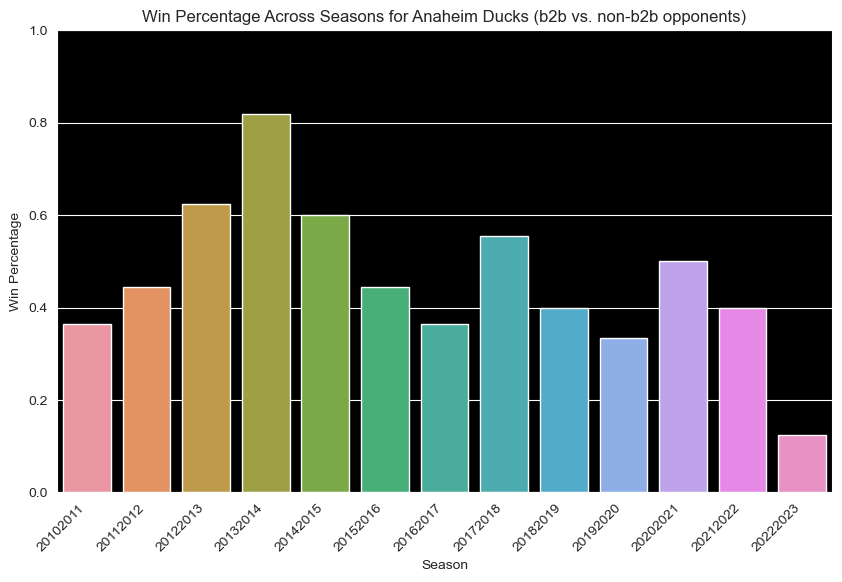

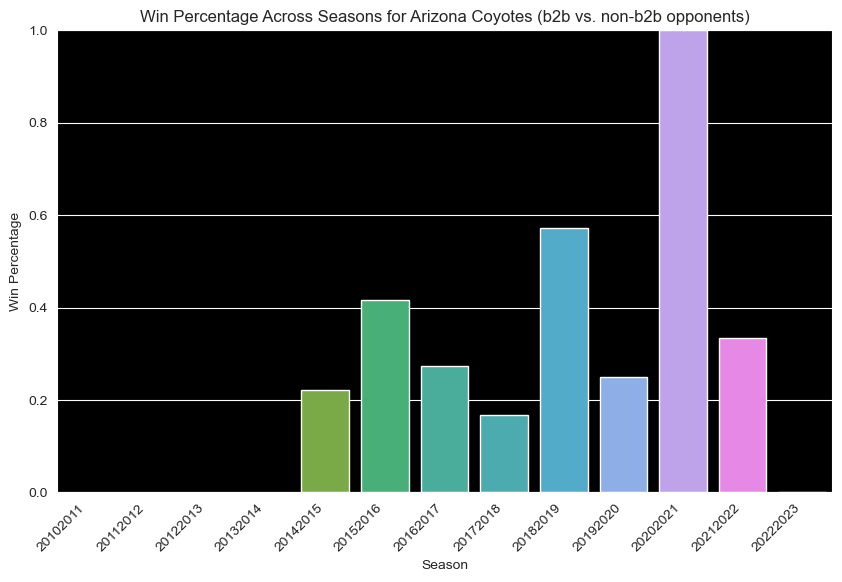

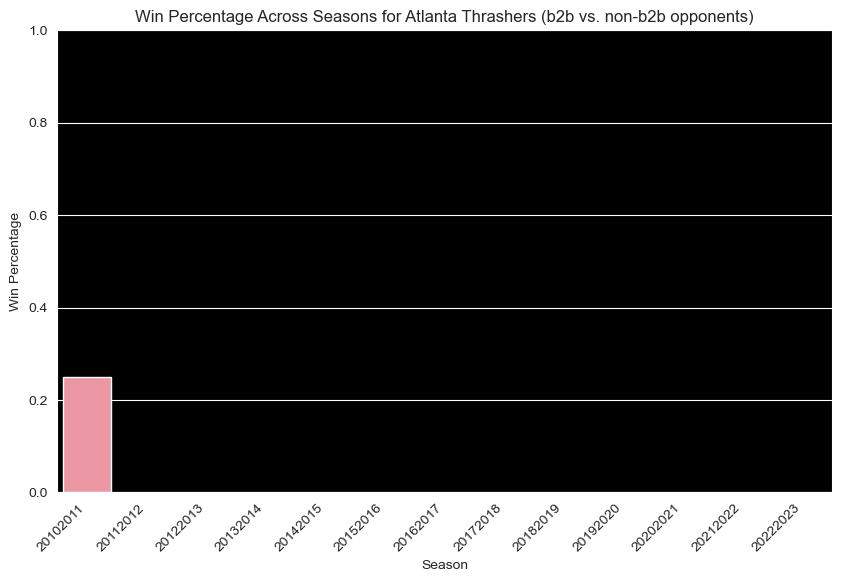

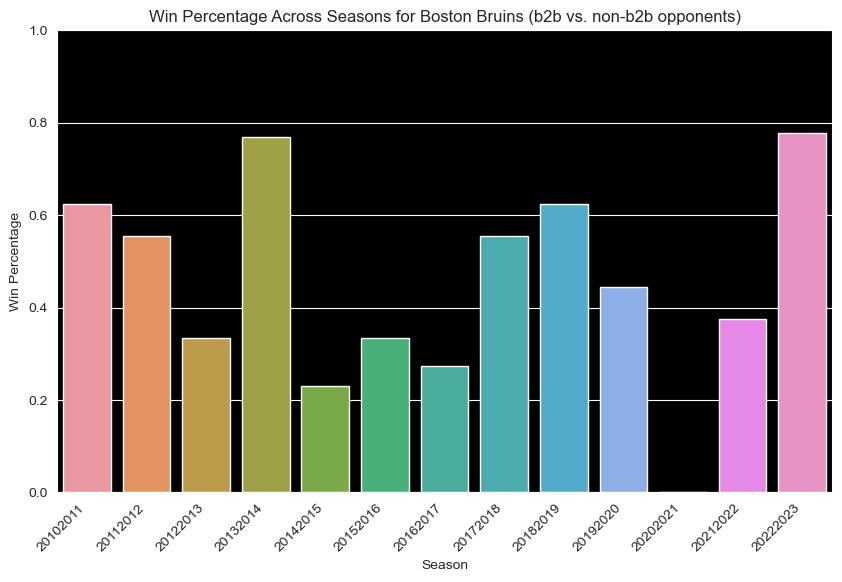

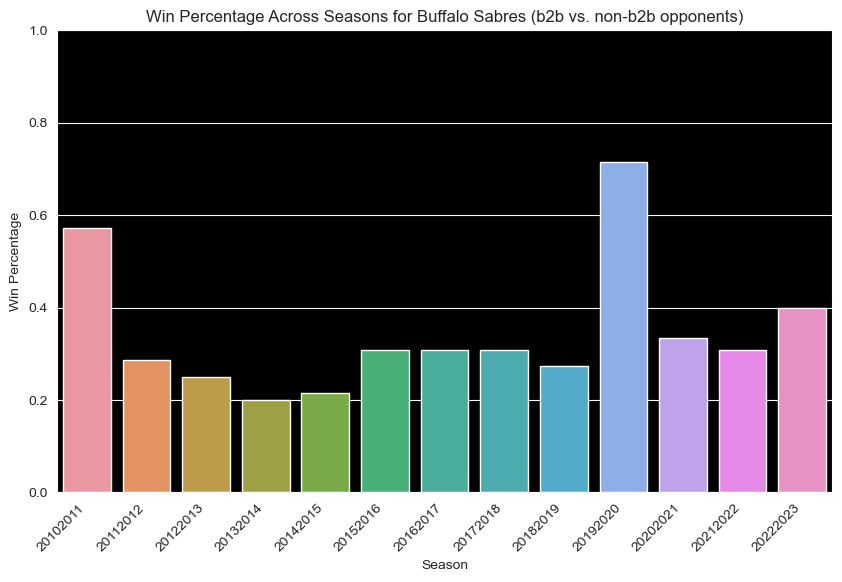

...

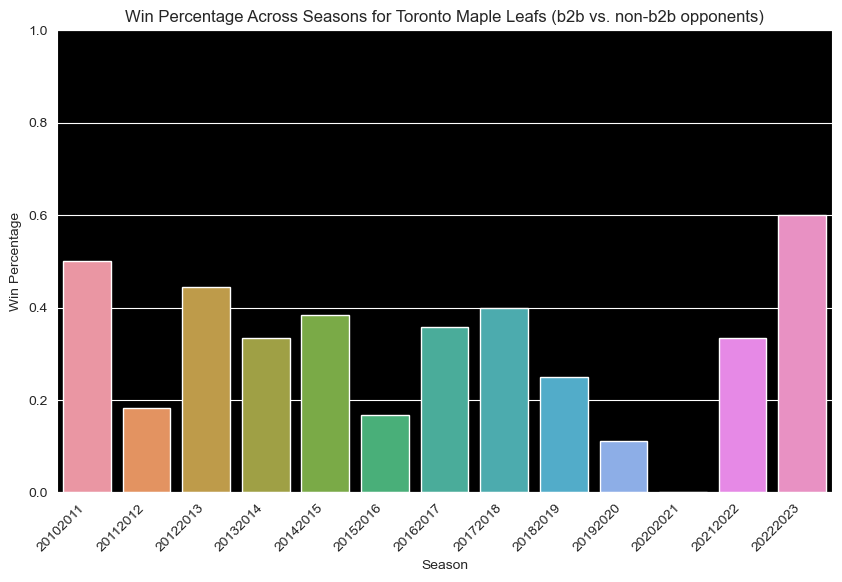

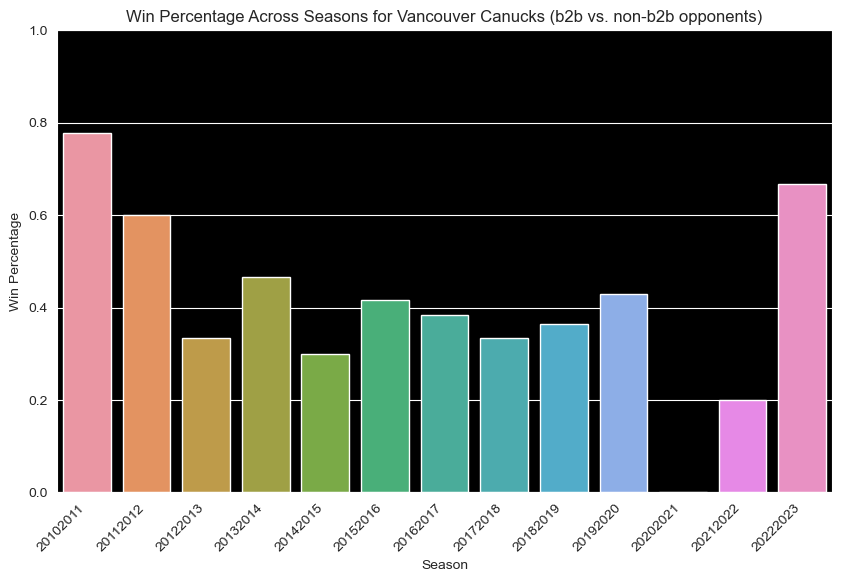

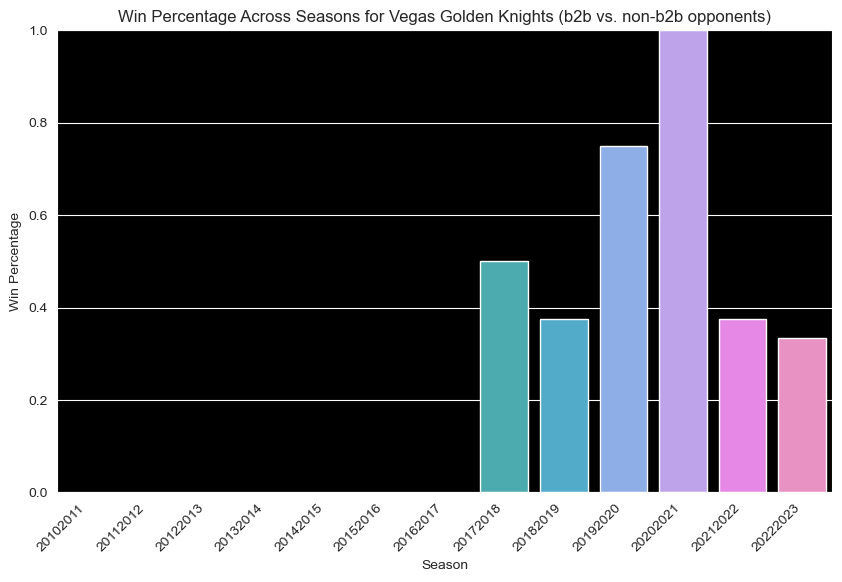

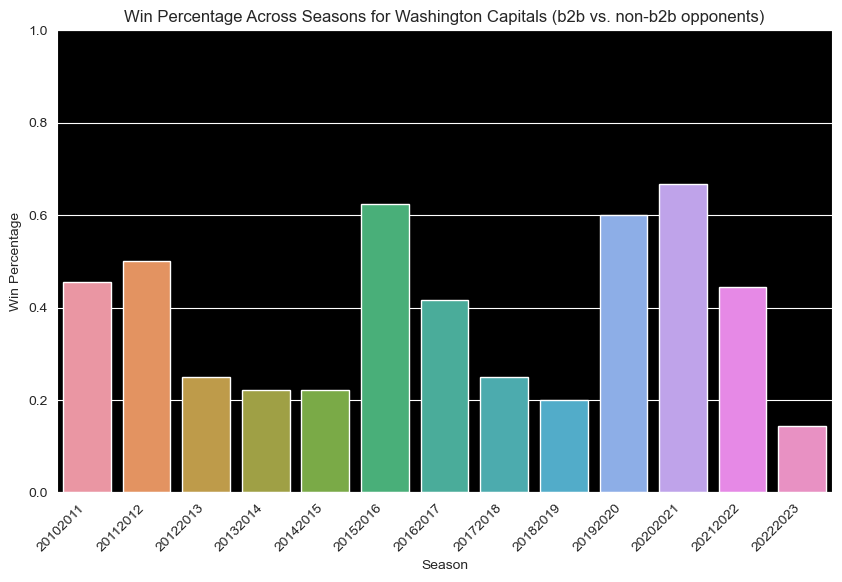

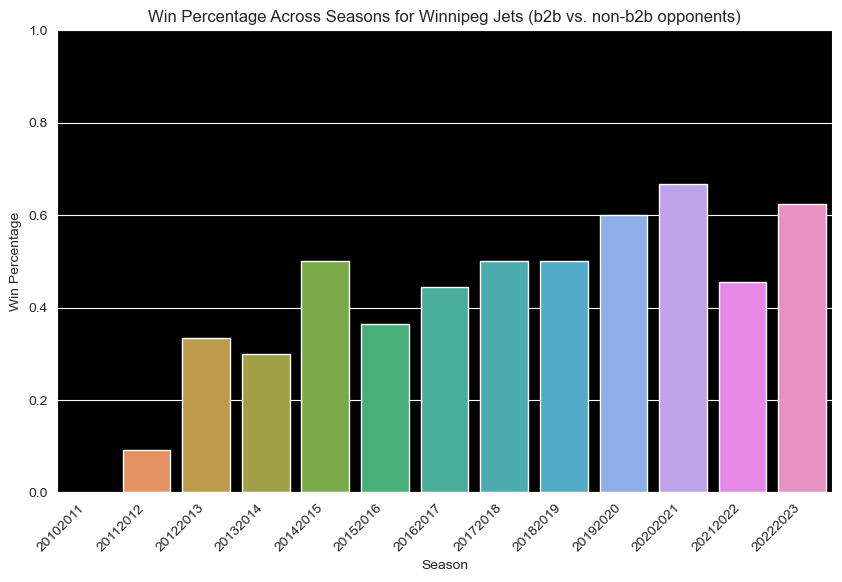

In [58]:
season_order = sorted(win_percentage['season'].unique())

for team in win_percentage1['team_name'].unique():
    team_data = win_percentage1[win_percentage1['team_name'] == team]
    plt.figure(figsize=(10, 6))
    sns.barplot(x='season', y='b2b_vs_non_b2b_win_percentage', 
                data = team_data, 
                order = season_order)
    plt.xticks(
        rotation = 45, 
        horizontalalignment = 'right',
        fontweight = 'light',
        fontsize = 'medium'
    )
    plt.title(f'Win Percentage Across Seasons for {team} (b2b vs. non-b2b opponents)')
    plt.ylabel('Win Percentage')
    plt.xlabel('Season')
    plt.ylim(0, 1)
    safe_filename = team.replace(" ", "_").replace("/", "_")
    fig.savefig(os.path.join(output_directory, f'win_percentage(b2bvsnonb2b)_{safe_filename}.png'), bbox_inches='tight')

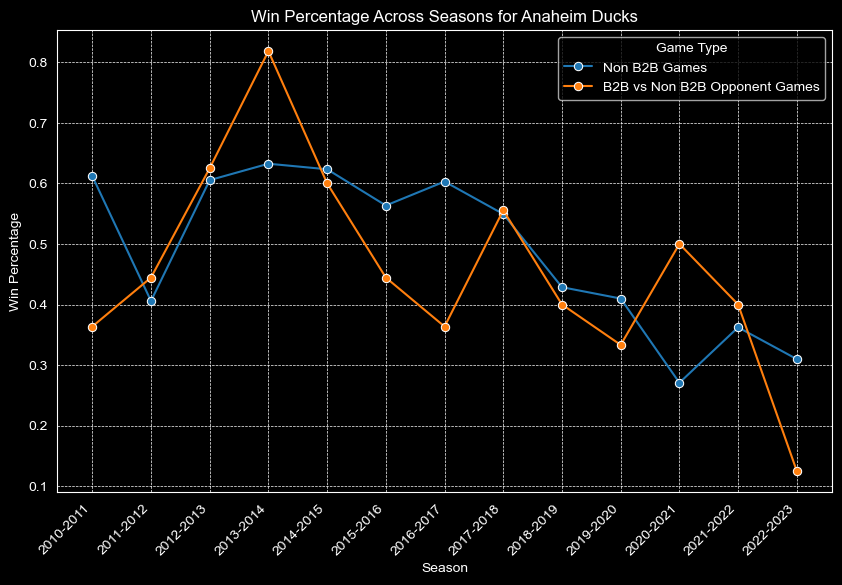

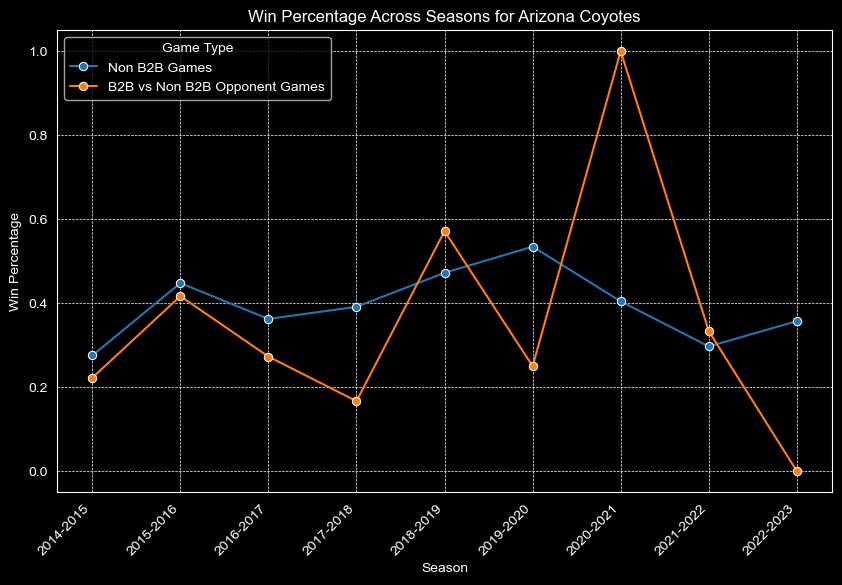

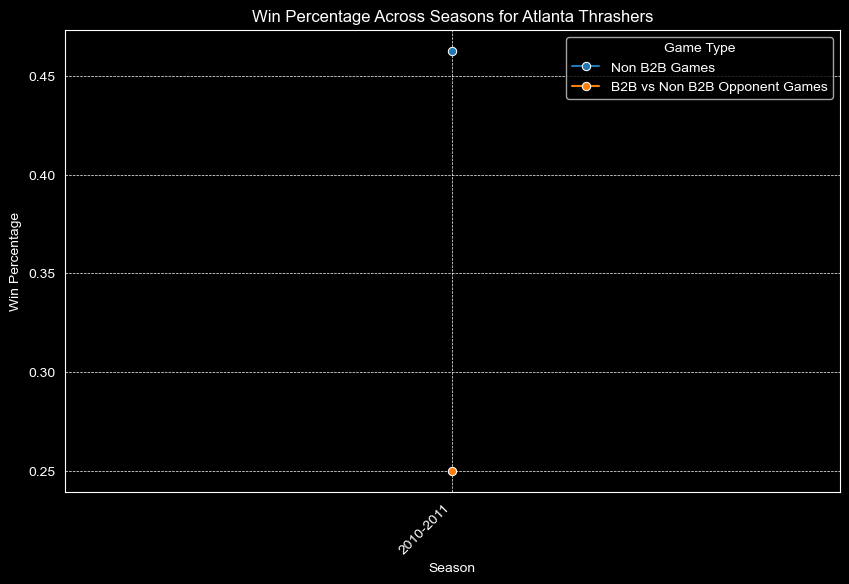

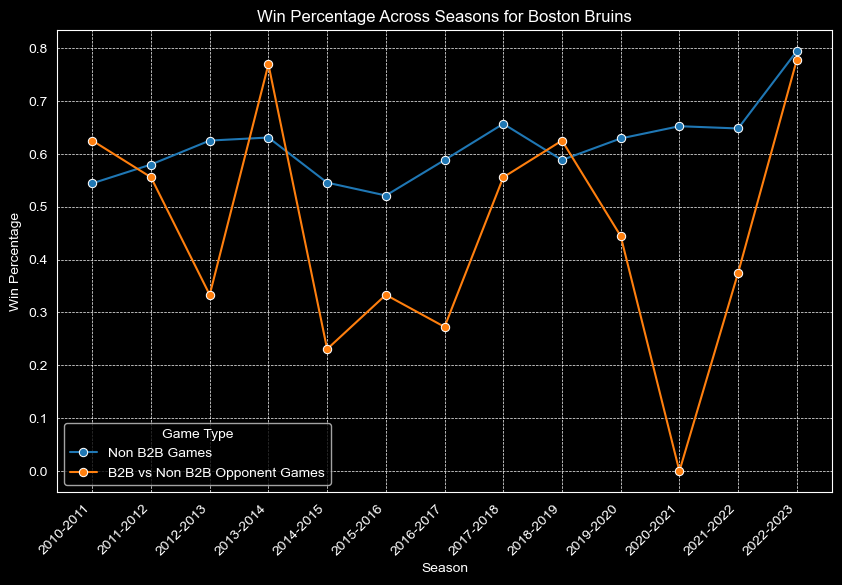

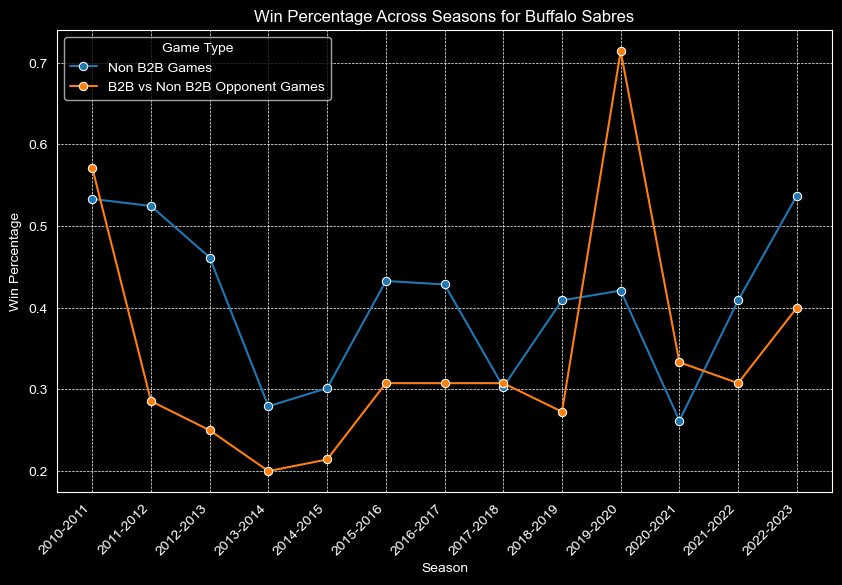

...

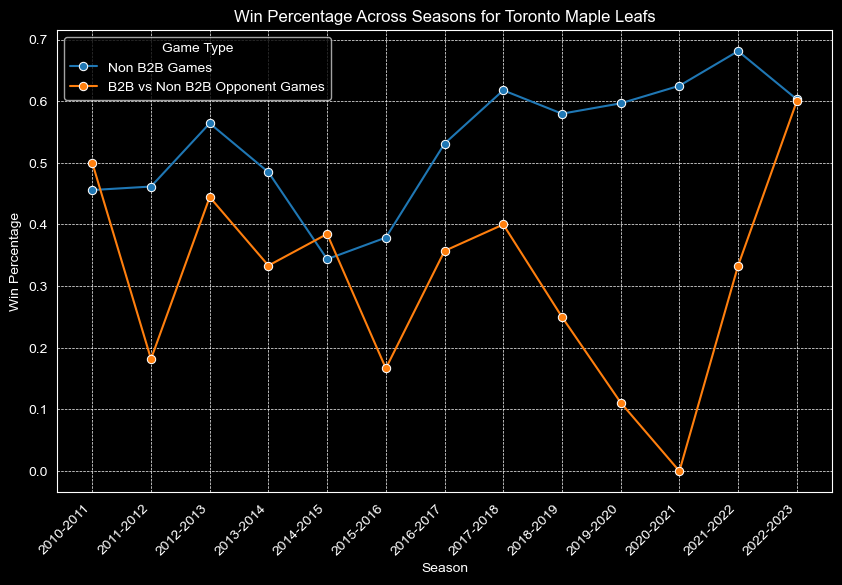

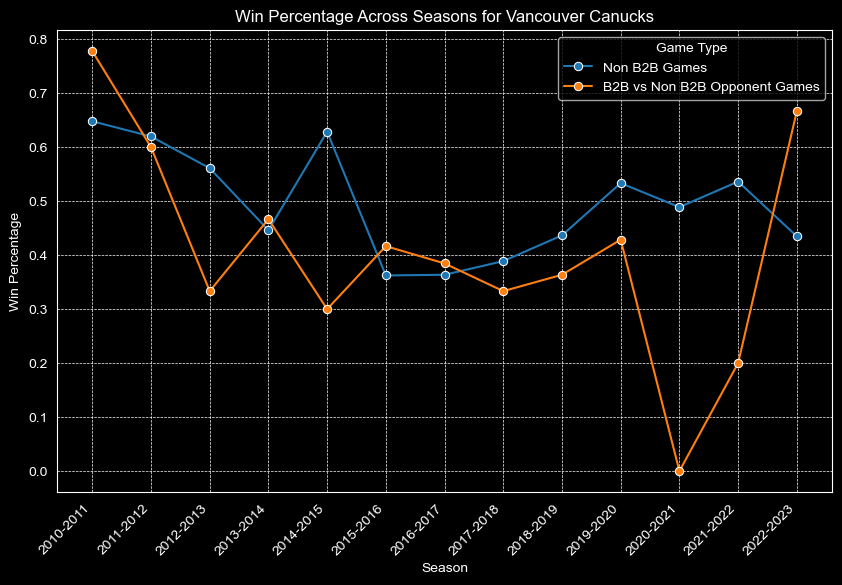

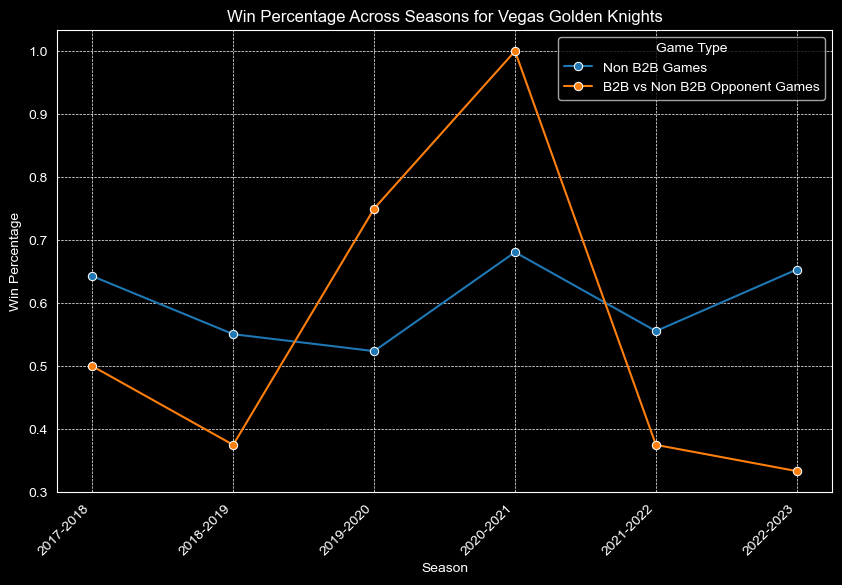

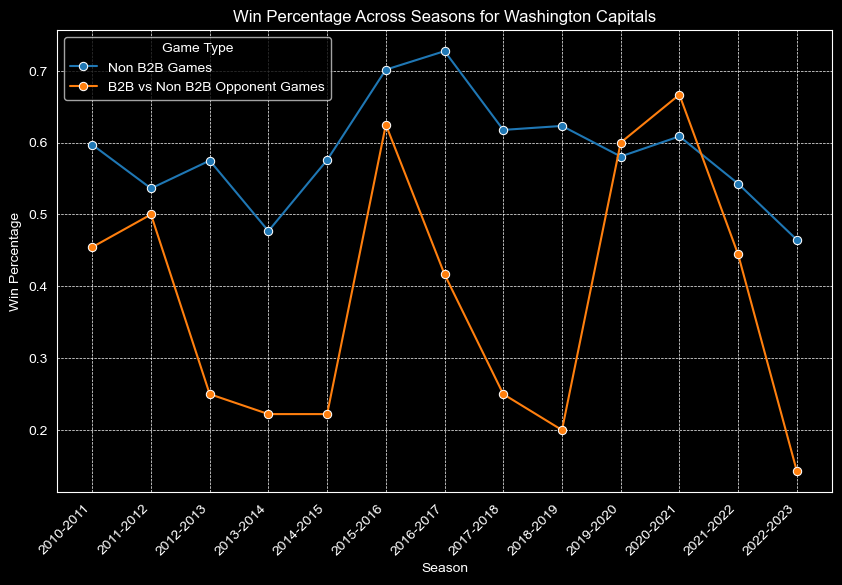

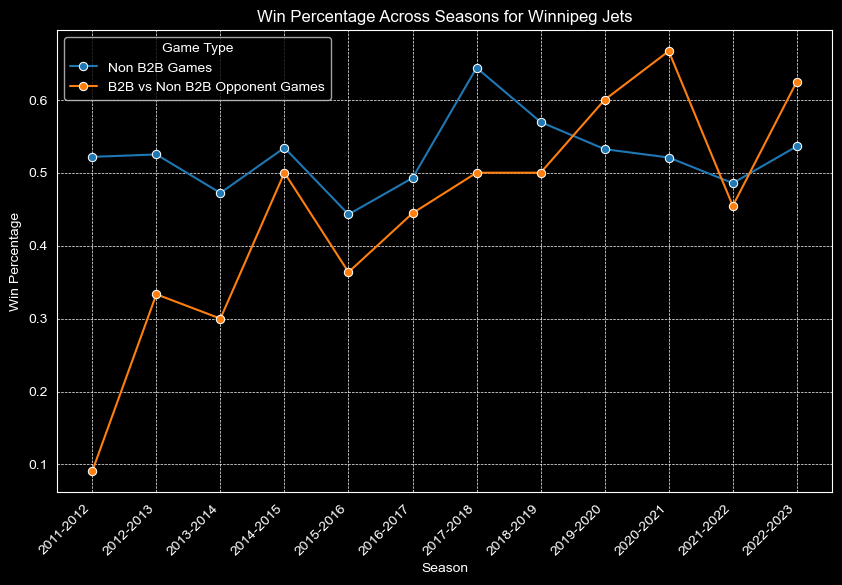

In [64]:
games1 = []
for index, row in df1.iterrows():
    for side in ['home', 'away']:
        opposing_side = 'away' if side == 'home' else 'home'
        is_team_b2b = row[side + '_b2b']
        is_opponent_b2b = row[opposing_side + '_b2b']
        is_winner = row['winner'] == row[side + 'name']
        team_name = row[side + 'name']
        season = row['season']
        games1.append([team_name, season, is_team_b2b, is_opponent_b2b, is_winner])

games_df1 = pd.DataFrame(games1, columns=['team_name', 'season', 'is_team_b2b', 'is_opponent_b2b', 'is_winner'])


mask_team_b2b = games_df1['is_team_b2b'] == 1
mask_team_not_b2b = games_df1['is_team_b2b'] == 0
mask_opponent_not_b2b = games_df1['is_opponent_b2b'] == 0

b2b_vs_non_b2b_games = games_df1[mask_team_b2b & mask_opponent_not_b2b]
win_percentage_b2b = (b2b_vs_non_b2b_games.groupby(['team_name', 'season']).is_winner.mean().reset_index().rename(columns={'is_winner': 'b2b_win_percentage'}))


non_b2b_games = games_df1[mask_team_not_b2b]
win_percentage_non_b2b = (non_b2b_games.groupby(['team_name', 'season']).is_winner.mean().reset_index().rename(columns={'is_winner': 'non_b2b_win_percentage'}))

merged_win_percentages = pd.merge(win_percentage_non_b2b, win_percentage_b2b, on=['team_name', 'season'])
merged_win_percentages['season'] = merged_win_percentages['season'].apply(format_season)

season_order = sorted(merged_win_percentages['season'].unique())

for team in merged_win_percentages['team_name'].unique():
    team_data = merged_win_percentages[merged_win_percentages['team_name'] == team]
    fig = plt.figure(figsize=(10, 6))
    fig.patch.set_facecolor('black')
    
    sns.lineplot(x='season', y='non_b2b_win_percentage', data=team_data, label='Non B2B Games', marker='o')
    sns.lineplot(x='season', y='b2b_win_percentage', data=team_data, label='B2B vs Non B2B Opponent Games', marker='o')

    plt.xticks(rotation=45, horizontalalignment='right', fontweight='light', fontsize='medium')
    plt.title(f'Win Percentage Across Seasons for {team}', color = '#FFFFFF')
    plt.ylabel('Win Percentage', color = '#FFFFFF')
    plt.xlabel('Season', color = '#FFFFFF')
    ax = plt.gca()
    ax.tick_params(axis='x', colors='#FFFFFF')
    ax.tick_params(axis='y', colors='#FFFFFF')
    ax.xaxis.label.set_color('#FFFFFF')
    ax.yaxis.label.set_color('#FFFFFF')
    
    legend = plt.legend(title='Game Type')
    plt.setp(legend.get_texts(), color='#FFFFFF')
    plt.setp(legend.get_title(), color='#FFFFFF')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.show()
    
    safe_filename = team.replace(" ", "_").replace("/", "_")
    fig.savefig(os.path.join(output_directory, f'win_percentage_(b2bvsnonb2b)(line)_{safe_filename}.png'), bbox_inches='tight')


# ELO ratings

In [60]:
K = 8
I = 1.0  
M_factor = 0.85
HGA_start = 35
Start_elo = 1400

ratings = {team: Start_elo for team in pd.concat([df['homename'], df['awayname']]).unique()}

df['home_elo'] = 0
df['away_elo'] = 0

for index, row in df.iterrows():

    home_team = row['homename']
    away_team = row['awayname']

    df.loc[index, 'home_elo'] = ratings[home_team]
    df.loc[index, 'away_elo'] = ratings[away_team]

    home_score = row['homescore']
    away_score = row['awayscore']

    
    home_advantage = HGA_start  

    expected_home = 1 / (1 + 10 ** ((ratings[away_team] - ratings[home_team] + home_advantage) / 400))
    expected_away = 1 - expected_home

    outcome_home = 1 if home_score > away_score else (0 if home_score < away_score else 0.5)

    goal_diff = home_score - away_score
    adjusted_goal_diff = goal_diff - M_factor * (ratings[home_team] - ratings[away_team] + home_advantage) / 100
    M = max(1, np.log(abs(adjusted_goal_diff) + np.e) - 1)

    elo_change = K * I * M * (outcome_home - expected_home)

    ratings[home_team] += elo_change
    ratings[away_team] -= elo_change  


In [61]:
df.head(5)

,Unnamed: 0.1,Unnamed: 0,ID,link,type,season,date,homeid,homename,homescore,awayid,awayname,awayscore,state,venue,home_b2b,home_3in4,home_5in8,away_b2b,away_3in4,away_5in8,is_b2b_game,is_3in4_game,is_5in8_game,winner,home_elo,away_elo
0,0,0,2000020001,/api/v1/game/2000020001/feed/live,R,20002001,2000-10-04,25,Dallas Stars,2,21,Colorado Avalanche,2,Final,Reunion Arena,0,0,0,0,0,0,0,0,0,Colorado Avalanche,1400.0,1400.0
1,1,0,2000020002,/api/v1/game/2000020002/feed/live,R,20002001,2000-10-05,6,Boston Bruins,4,9,Ottawa Senators,4,Final,FleetCenter,0,0,0,0,0,0,0,0,0,Ottawa Senators,1400.0,1400.0
2,2,1,2000020003,/api/v1/game/2000020003/feed/live,R,20002001,2000-10-05,7,Buffalo Sabres,4,16,Chicago Blackhawks,2,Final,HSBC Arena,0,0,0,0,0,0,0,0,0,Buffalo Sabres,1400.0,1400.0
3,3,2,2000020004,/api/v1/game/2000020004/feed/live,R,20002001,2000-10-05,4,Philadelphia Flyers,6,23,Vancouver Canucks,3,Final,First Union Center,0,0,0,0,0,0,0,0,0,Philadelphia Flyers,1400.0,1400.0
4,4,3,2000020005,/api/v1/game/2000020005/feed/live,R,20002001,2000-10-05,20,Calgary Flames,3,17,Detroit Red Wings,4,Final,Pengrowth Saddledome,0,0,0,0,0,0,0,0,0,Detroit Red Wings,1400.0,1400.0


In [63]:
df.to_csv("elo_ratings_team2.csv")